In [ ]:
http://127.0.0.1:8893/?token=38826c3b9279ecb2e3cd2fe17deb5611f44c7d376269ae8f


In [ ]:
import torch

In [ ]:
torch.cuda.get_device_properties(0)

_CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15101MB, multi_processor_count=40)

In [ ]:
import sys
print(sys.executable)

/usr/bin/python3


In [ ]:
!pip install plotly

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


 # Importing the useful python modules

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

import pandas as pd
from plotly import graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns
import plotly.express as px

#from keras.layers import LSTM,Dense,Conv1D,MaxPooling1D,Flatten,TimeDistributed,RepeatVector,GRU
#from keras.models import Sequential
#from keras.losses import mean_squared_error
#from keras.optimizers import Adam
from sklearn.metrics import r2_score
#import tensorflow as tf

from datetime import datetime, timedelta

from sklearn.preprocessing import MinMaxScaler, LabelEncoder
#from keras.callbacks import EarlyStopping
from sklearn.metrics import r2_score,mean_squared_error

import itertools
import random
import os

from scipy.spatial.distance import pdist, squareform
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.preprocessing import MinMaxScaler, StandardScaler

#import tensorflow as tf
#from tensorflow.keras.models import *
#from tensorflow.keras.layers import *
#from tensorflow.keras.optimizers import *
#from tensorflow.keras.utils import *
from scipy.stats import zscore

from numpy import array

import tslearn
from tslearn.clustering import KShape
from scipy.stats import zscore

ModuleNotFoundError: ignored

# Data preprocessing

## Sorting the useful and qualitative data from the measurements file

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/AlmudenaMaroto/OMP_1/main/Predis_Energy.csv',encoding="utf-8",sep=',')
#df1 = pd.read_csv('load.csv',encoding="utf-8",sep=',')

In [ ]:
df0=df.drop(columns='epochtime_ms')
df0.head()

The next cell is dedicated to removing the outliers and the columns Eclairage, PC and CTA because they won't be used in the project

In [ ]:
df['date_time']=pd.to_datetime(df['date_time'],format='%d/%m/%Y %H:%M:%S')

In [ ]:
df['Hour'] = df['date_time'].dt.hour
df

search for different between recurent row bigger than 1 hour,

replicate iloc(i) and add it to the end

add 1 hour and keep the same consumption as i

move it between i and i+1

rearrange the index



In [ ]:
for i in range(1,len(df)-1):
  if df['Hour'].iloc[i+1] - df['Hour'].iloc[i] != 1 and df['Hour'].iloc[i+1] - df['Hour'].iloc[i] != -23:
    print([df['Hour'].iloc[i+1],df['Hour'].iloc[i],df['date_time'].iloc[i],i])
    # df = df.append(pd.DataFrame(np.array([df.iloc[i]]),columns=['epochtime_ms','date_time','CTA','Eclairage','PC','conso_global','Hour']))
    df.loc[df.shape[0]] = df.iloc[i]
    print(df.iloc[df.shape[0]-1])
    # print(df.iloc[len(df)-1])
    df['date_time'].iloc[len(df)-1] = df['date_time'].iloc[i] + timedelta(hours=1)
    df['Hour'].iloc[len(df)-1] = df['Hour'].iloc[i] + 1
    newindex= list(range(0,i+1))+[len(df)-1]+list(range(i+1,len(df)-1))
    print(newindex)
    df = df.reindex(newindex)
    print(df.tail)
    df = df.reset_index(drop=True)

In [ ]:
for i in range(1,len(df)-1):
  if df['Hour'].iloc[i+1] - df['Hour'].iloc[i] != 1 and df['Hour'].iloc[i+1] - df['Hour'].iloc[i] != -23:
    print([df['Hour'].iloc[i+1],df['Hour'].iloc[i],df['date_time'].iloc[i]])

add a row on top ( firt one ) having the same value as the first

In [ ]:
df.loc[-1] = df.iloc[0]  # adding a row
df['date_time'].iloc[-1] = df['date_time'].iloc[-1] - timedelta(hours=1)
df['Hour'].iloc[-1] = df['Hour'].iloc[-1] - 1
df.index = df.index + 1  # shifting index
df.sort_index(inplace=True)

In [ ]:



#df = df[df.conso_global > -20] ## Here if we pùt 0 we delete a lot of data of 2019 that is negative. Maybe a mistake in the measure.

df.conso_global = np.where(df.conso_global < 0, 0,df.conso_global) # change negative values with 0

y = df['conso_global']
removed_outliers = y.between(y.quantile(.002),y.quantile(.996)) # check the value between .002 and .996 quantile
index_names = df[~removed_outliers].index # the index of the outliers (~ = opposite)

one_week = 24*7
# replace with values from previous wweek unless it is the first week => 0
for idx in index_names:
  if idx>one_week:
    df.loc[idx,['conso_global']] = df.loc[idx-one_week,['conso_global']]
  else :
    df.loc[idx,['conso_global']] = 0

conso_glob_outliers=len(index_names)



y = df['CTA']
removed_outliers = y.between(y.quantile(.002),y.quantile(.996))
index_names = df[~removed_outliers].index
CTA_outliers=len(index_names)
print(index_names)


for idx in index_names:
  if idx>one_week:
    df.loc[idx,['conso_global']] = df.loc[idx-one_week,['conso_global']]
  else :
    df.loc[idx,['conso_global']] = 0

y = df['Eclairage']
removed_outliers = y.between(y.quantile(.002),y.quantile(.996))
index_names = df[~removed_outliers].index
Eclairage_outliers=len(index_names)

for idx in index_names:
  if idx>one_week:
    df.loc[idx,['conso_global']] = df.loc[idx-one_week,['conso_global']]
  else :
    df.loc[idx,['conso_global']] = 0


y = df['PC']
removed_outliers = y.between(y.quantile(.002),y.quantile(.996))
index_names = df[~removed_outliers].index
PC_outliers=len(index_names)
print(index_names)

for idx in index_names:
  if idx>one_week:
    df.loc[idx,['conso_global']] = df.loc[idx-one_week,['conso_global']]
  else :
    df.loc[idx,['conso_global']] = 0



df1 = df.set_index('date_time')

# print("total outliers : ", CTA_outliers+Eclairage_outliers+PC_outliers, "conso glob outliers :",conso_glob_outliers)

df = df.drop(columns=['epochtime_ms', 'CTA', 'Eclairage','PC' ])
df1 = df1.drop(columns=['epochtime_ms', 'CTA', 'Eclairage','PC' ])





Int64Index([ 4144,  4145,  4146,  4147,  4162,  4163,  4164,  4173,  4180,
             4181,
            ...
            39112, 39121, 39122, 39125, 39126, 39127, 39128, 39129, 39130,
            39131],
           dtype='int64', length=228)
Int64Index([11888, 14366, 14367, 14368, 14627, 14641, 14858, 24493, 27463,
            28144,
            ...
            37955, 37956, 37957, 37958, 38318, 38590, 38793, 38917, 38962,
            39132],
           dtype='int64', length=233)


Méthode 2 : méthode utilisée l'année dernière : celle ci retire les lignes contenant des outliers

In [ ]:
### features souhaitées :

utilisation_calendrier=1
jour_moins_7=1


In [ ]:
df.head()

,date_time,conso_global,Hour
0,2016-01-01 00:00:00,0.6899,0
1,2016-01-01 01:00:00,0.6899,1
2,2016-01-01 02:00:00,0.6800,2
3,2016-01-01 03:00:00,0.9600,3
4,2016-01-01 04:00:00,0.2500,4


In [ ]:
fig = px.line(df, x ='date_time', y = 'conso_global', title = 'Time series with slider')
fig.update_xaxes(rangeslider_visible = True)
fig.show()

In [ ]:
df = df[df.date_time >= '2017-09-01']
df = df[df.date_time < '2020-02-01']
df = df.reset_index()
df.drop(columns = ['index'],inplace=True, axis=1)
df.head()
df = df.set_index('date_time')

# Clustering the data for extracting different consumption profiles

In [ ]:
# Seperate the day information for grouping timeseries of load
df = df.reset_index()
df_cluster = df.copy()
df_cluster['Date'] = df_cluster['date_time'].dt.date
df_cluster['Hour'] = df_cluster['date_time'].dt.hour
df_cluster.drop(columns=['date_time'], inplace=True)


In [ ]:
df_cluster

,conso_global,Hour,Date
0,0.3398,0,2017-09-01
1,0.3506,1,2017-09-01
2,0.1494,2,2017-09-01
3,0.1602,3,2017-09-01
4,0.4804,4,2017-09-01
...,...,...,...
21187,0.9999,19,2020-01-31
21188,0.1700,20,2020-01-31
21189,0.5000,21,2020-01-31
21190,0.5000,22,2020-01-31


In [ ]:
for i in range(1,21187):
  if df_cluster['Hour'].iloc[i+1] - df_cluster['Hour'].iloc[i] != 1 and df_cluster['Hour'].iloc[i+1] - df_cluster['Hour'].iloc[i] != -23:
    print([df_cluster['Hour'].iloc[i+1],df_cluster['Hour'].iloc[i],df_cluster['Date'].iloc[i]])



In [ ]:
# Group into timeseries of load
df_cluster_ts= df_cluster.groupby(['Date']).agg(lambda x: list(x)).reset_index().sort_values(by='Date')
df_cluster_ts

,Date,conso_global,Hour
0,2017-09-01,"[0.3398000000015599, 0.3505999999997584, 0.149...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
1,2017-09-02,"[0.4003999999986263, 0.0898999999990337, 0.290...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
2,2017-09-03,"[0.2002000000011321, 0.2099999999991268, 0.200...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
3,2017-09-04,"[0.3398999999990337, 0.1797000000005937, 0.169...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
4,2017-09-05,"[0.1894000000011146, 0.1904999999987922, 0.699...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
...,...,...,...
878,2020-01-27,"[0.3300000000017462, 0.2789999999986321, 0.282...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
879,2020-01-28,"[0.8689000000003944, 0.8009999999994761, 0.620...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
880,2020-01-29,"[1.7089999999952852, 0.7110000000029686, 0.5, ...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
881,2020-01-30,"[0.4490000000005238, 0.5799999999981083, 0.410...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."


In [ ]:
# Include zscore of timeseries for further analysis
date_str = df_cluster_ts.Date.apply(lambda x: x.strftime('%Y-%m-%d')).str.split('-', expand=True)
df_zscore = df_cluster_ts.conso_global.apply(zscore) # measure how far from the mean
df_weekday = df_cluster_ts.Date.apply(lambda x: x.strftime('%A'))
df_month = df_cluster_ts.Date.apply(lambda x: x.strftime('%B'))
df_cluster_ts.insert(1, 'year', date_str[0])
df_cluster_ts.insert(2, 'month', df_month)
df_cluster_ts.insert(3, 'day', date_str[2])
df_cluster_ts.insert(4, 'weekday', df_weekday)
df_cluster_ts.insert(6, 'z_score', df_zscore)
df_cluster_ts

,Date,year,month,day,weekday,conso_global,z_score,Hour
0,2017-09-01,2017,September,01,Friday,"[0.3398000000015599, 0.3505999999997584, 0.149...","[-0.8491049098272412, -0.8387497283033392, -1....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
1,2017-09-02,2017,September,02,Saturday,"[0.4003999999986263, 0.0898999999990337, 0.290...","[0.17868823668773878, -0.9996010649947241, -0....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
2,2017-09-03,2017,September,03,Sunday,"[0.2002000000011321, 0.2099999999991268, 0.200...","[-0.3177756994168771, -0.3074747161226642, -0....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
3,2017-09-04,2017,September,04,Monday,"[0.3398999999990337, 0.1797000000005937, 0.169...","[-0.7486538025596414, -0.8677800685574014, -0....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
4,2017-09-05,2017,September,05,Tuesday,"[0.1894000000011146, 0.1904999999987922, 0.699...","[-1.0873628229151275, -1.0864205210429443, -0....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
...,...,...,...,...,...,...,...,...
878,2020-01-27,2020,January,27,Monday,"[0.3300000000017462, 0.2789999999986321, 0.282...","[-1.0581166010026168, -1.0755571439558498, -1....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
879,2020-01-28,2020,January,28,Tuesday,"[0.8689000000003944, 0.8009999999994761, 0.620...","[-0.8910882846150274, -0.9254772192038647, -1....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
880,2020-01-29,2020,January,29,Wednesday,"[1.7089999999952852, 0.7110000000029686, 0.5, ...","[-0.44237388413534157, -0.9901299867138765, -1...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
881,2020-01-30,2020,January,30,Thursday,"[0.4490000000005238, 0.5799999999981083, 0.410...","[-0.9133843570052629, -0.8557582775323775, -0....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."


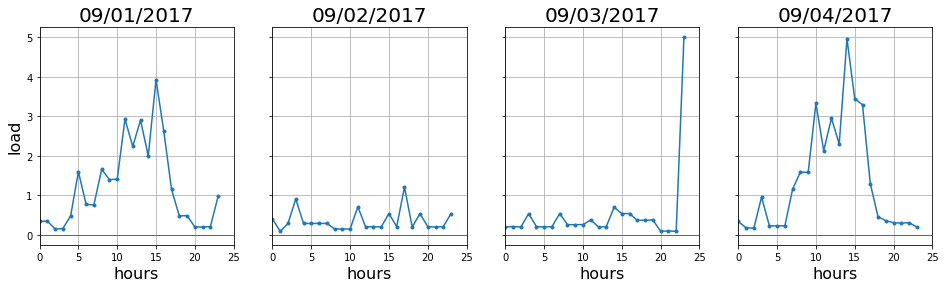

In [ ]:
def plot_series(series, x_label="$t$", y_label="$x(t)$", title=None):
    plt.plot(series, ".-")
    n_steps = len(series)
    plt.grid(True)
    if x_label:
        plt.xlabel(x_label, fontsize=16)
    if y_label:
        plt.ylabel(y_label, fontsize=16)
    plt.hlines(0, 0, 100, linewidth=1)
    plt.xlim([0, len(series) + 1])
    plt.title(title, fontsize=20)


time_series_new = df_cluster_ts[:4]

ncols = time_series_new.shape[0]
fig, axes = plt.subplots(nrows=1, ncols=ncols, sharey=True, figsize=(16, 4))
for col in range(ncols):
    plt.sca(axes[col])
    plot_series(time_series_new.conso_global[col], x_label="hours",
                y_label=("load" if col==0 else None), title=time_series_new.Date[col].strftime('%m/%d/%Y'))

In [ ]:
# Add the third dimesion for kshape function
# data_array = df_cluster_ts['conso_global'].to_list()
# ts_array = np.expand_dims(data_array, axis=data_array.ndim)
# ts_array.shape
# data_array
# data_array[0]

# Add the third dimesion for kshape function
data_array = np.array(df_cluster_ts['conso_global'].to_list())
ts_array = np.expand_dims(data_array, axis=data_array.ndim)
print(ts_array.shape,data_array.shape)
print(ts_array,data_array)


(883, 24, 1) (883, 24)
[[[0.3398]
  [0.3506]
  [0.1494]
  ...
  [0.2002]
  [0.21  ]
  [0.9795]]

 [[0.4004]
  [0.0899]
  [0.29  ]
  ...
  [0.1992]
  [0.21  ]
  [0.54  ]]

 [[0.2002]
  [0.21  ]
  [0.2002]
  ...
  [0.1006]
  [0.0899]
  [4.9999]]

 ...

 [[1.709 ]
  [0.711 ]
  [0.5   ]
  ...
  [0.33  ]
  [0.689 ]
  [0.702 ]]

 [[0.449 ]
  [0.58  ]
  [0.41  ]
  ...
  [0.17  ]
  [0.5   ]
  [0.5   ]]

 [[0.08  ]
  [0.09  ]
  [0.83  ]
  ...
  [0.5   ]
  [0.5   ]
  [0.5   ]]] [[0.3398 0.3506 0.1494 ... 0.2002 0.21   0.9795]
 [0.4004 0.0899 0.29   ... 0.1992 0.21   0.54  ]
 [0.2002 0.21   0.2002 ... 0.1006 0.0899 4.9999]
 ...
 [1.709  0.711  0.5    ... 0.33   0.689  0.702 ]
 [0.449  0.58   0.41   ... 0.17   0.5    0.5   ]
 [0.08   0.09   0.83   ... 0.5    0.5    0.5   ]]


## DTW CLUSTERING

In [ ]:
from tslearn.clustering import TimeSeriesKMeans
DTWClust = TimeSeriesKMeans(n_clusters=4, metric="softdtw", max_iter=50, random_state=0)
DTWClust.fit(ts_array)
labels = DTWClust.predict(ts_array)

# Group timeseries
ts_clustered = []
for i in range(max(labels)+1):
    ts_clustered.append(df_cluster_ts[labels==i].reset_index(drop=True))

In [ ]:
ts_clustered[0]

,Date,year,month,day,weekday,conso_global,z_score,Hour
0,2017-09-02,2017,September,02,Saturday,"[0.4003999999986263, 0.0898999999990337, 0.290...","[0.17868823668773878, -0.9996010649947241, -0....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
1,2017-09-03,2017,September,03,Sunday,"[0.2002000000011321, 0.2099999999991268, 0.200...","[-0.3177756994168771, -0.3074747161226642, -0....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
2,2017-09-09,2017,September,09,Saturday,"[0.1904000000013184, 0.1796999999987747, 0.190...","[-0.35120121684687267, -0.3931278927378355, -0...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
3,2017-09-10,2017,September,10,Sunday,"[0.1298999999999068, 0.6894000000011147, 0.270...","[-0.897419249562699, 1.0582984392487123, -0.40...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
4,2017-09-16,2017,September,16,Saturday,"[1.580100000001039, 0.1405999999988125, 0.1298...","[3.273395783943635, -0.6791439913855593, -0.70...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
...,...,...,...,...,...,...,...,...
281,2020-01-12,2020,January,12,Sunday,"[0.25, 0.5, 0.5, 0.5, 0.25, 0.25, 1.0, 0.66999...","[-1.1990082605627517, -0.4101005334679525, -0....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
282,2020-01-18,2020,January,18,Saturday,"[0.737899999999172, 1.0708999999978914, 0.7301...","[-0.17796651045920808, 0.5708533018850238, -0....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
283,2020-01-19,2020,January,19,Sunday,"[1.3301000000001295, 0.3298999999997249, 0.670...","[0.5575475446016959, -1.6428696095896889, -0.8...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
284,2020-01-25,2020,January,25,Saturday,"[0.1409999999996216, 1.2280999999975393, 1.060...","[-0.8484976061715503, 1.44889155364604, 1.0955...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."


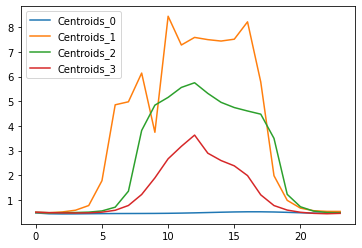

In [ ]:
for i in range(max(labels)+1):
    plt.plot(DTWClust.cluster_centers_[i], label="Centroids_" + str(i))
    plt.legend()

In [ ]:
clsmodel = DTWClust

In [ ]:
weekend = ['Saturday', 'Sunday']
weekday = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']

## Cluster 1

In [ ]:
i=0
n = ts_clustered[i].__len__()
rand_index = np.arange(n)
np.random.shuffle(rand_index)
ts_group = ts_clustered[i].iloc[rand_index]
ts_group.conso_global

182    [0.227999999999156, 0.2309999999997671, 0.9899...
13     [0.0900000000001455, 0.8699999999989814, 0.25,...
236    [0.5889999999999418, 0.430000000000291, 0.4219...
48     [0.1700000000000727, 0.180000000000291, 0.7600...
151    [0.110000000000582, 0.2299999999995634, 0.8800...
                             ...                        
3      [0.1298999999999068, 0.6894000000011147, 0.270...
143    [0.6700000000000728, 0.2199999999993451, 0.220...
38     [0.2299999999995634, 0.2399999999979627, 0.890...
150    [0.8299999999999272, 0.0499999999992724, 0.050...
209    [0.579900000003363, 1.0000999999983833, 0.1699...
Name: conso_global, Length: 286, dtype: object

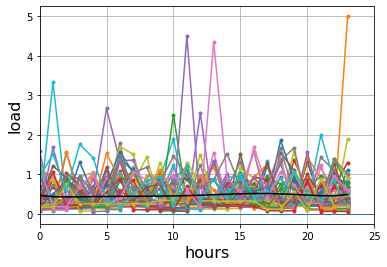

In [ ]:
# raw_data
i=0
n = ts_clustered[i].__len__()
rand_index = np.arange(n)
np.random.shuffle(rand_index)
ts_group = ts_clustered[i].iloc[rand_index]
for j in range(50):
    plot_series(ts_group.conso_global[j], x_label=("hours" if j==0 else None),
                y_label=("load" if j==0 else None))
plt.plot(clsmodel.cluster_centers_[i], color='k');

In [ ]:
# Check day and month information according daily load sequences
print("Total of days: ", ts_clustered[i].__len__(), "\n")
print("Number of time-series for different week days: \n")
print(ts_group.weekday.value_counts())
print("\n")
print("Number of time-series for different months: \n")
print(ts_group.month.value_counts())

Total of days:  286 

Number of time-series for different week days: 

Sunday       122
Saturday     122
Monday        10
Tuesday        9
Thursday       8
Friday         8
Wednesday      7
Name: weekday, dtype: int64


Number of time-series for different months: 

December     47
January      31
September    28
August       27
October      25
November     24
June         20
May          18
April        18
March        17
July         16
February     15
Name: month, dtype: int64


## Cluster 2

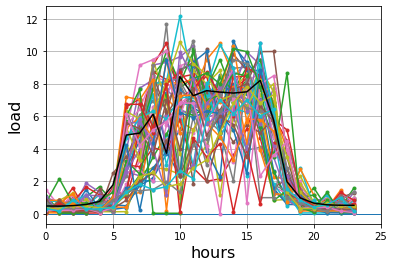

In [ ]:
# raw data
i=1
n = ts_clustered[i].__len__()
rand_index = np.arange(n)
np.random.shuffle(rand_index)
ts_group = ts_clustered[i].iloc[rand_index]
for j in range(50):
    plot_series(ts_group.conso_global[j], x_label=("hours" if j==0 else None),
                y_label=("load" if j==0 else None))
plt.plot(clsmodel.cluster_centers_[i], color='k');

In [ ]:
# Check day and month information according daily load sequences
print("Total of days: ", ts_clustered[i].__len__(), "\n")
print("Number of time-series for different week days: \n")
print(ts_group.weekday.value_counts())
print("\n")
print("Number of time-series for different months: \n")
print(ts_group.month.value_counts())

Total of days:  64 

Number of time-series for different week days: 

Thursday     15
Monday       13
Friday       12
Tuesday      12
Wednesday    10
Saturday      1
Sunday        1
Name: weekday, dtype: int64


Number of time-series for different months: 

December    17
November    13
July        11
January      9
March        4
June         4
February     3
August       2
May          1
Name: month, dtype: int64


## Cluster 3

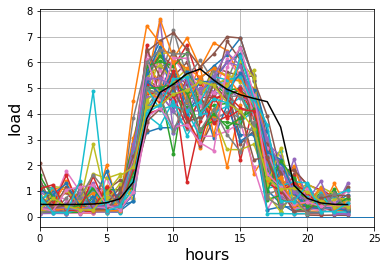

In [ ]:
# raw data
i=2
n = ts_clustered[i].__len__()
rand_index = np.arange(n)
np.random.shuffle(rand_index)
ts_group = ts_clustered[i].iloc[rand_index]
for j in range(50):
    plot_series(ts_group.conso_global[j], x_label=("hours" if j==0 else None),
                y_label=("load" if j==0 else None))
plt.plot(clsmodel.cluster_centers_[i], color='k');

In [ ]:
# Check day and month information according daily load sequences
print("Total of days: ", ts_clustered[i].__len__(), "\n")
print("Number of time-series for different week days: \n")
print(ts_group.weekday.value_counts())
print("\n")
print("Number of time-series for different months: \n")
print(ts_group.month.value_counts())

Total of days:  220 

Number of time-series for different week days: 

Monday       47
Tuesday      46
Wednesday    46
Thursday     41
Friday       39
Saturday      1
Name: weekday, dtype: int64


Number of time-series for different months: 

January      43
November     37
February     29
December     26
July         18
March        16
September    12
August       11
April        10
May           8
June          7
October       3
Name: month, dtype: int64


## Cluster 4

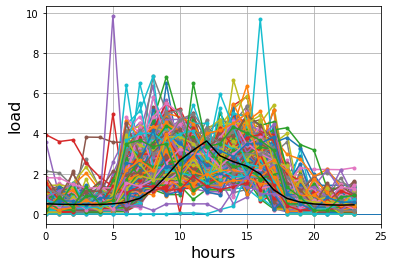

In [ ]:
# raw data
i=3
n = ts_clustered[i].__len__()
rand_index = np.arange(n)
np.random.shuffle(rand_index)
ts_group = ts_clustered[i].iloc[rand_index]
for j in range(n):
    plot_series(ts_group.conso_global[j], x_label=("hours" if j==0 else None),
                y_label=("load" if j==0 else None))
plt.plot(clsmodel.cluster_centers_[i], color='k');

In [ ]:
# Check day and month information according daily load sequences
print("Total of days: ", ts_clustered[i].__len__(), "\n")
print("Number of time-series for different week days: \n")
print(ts_group.weekday.value_counts())
print("\n")
print("Number of time-series for different months: \n")
print(ts_group.month.value_counts())

Total of days:  313 

Number of time-series for different week days: 

Friday       68
Wednesday    63
Thursday     62
Tuesday      59
Monday       56
Sunday        3
Saturday      2
Name: weekday, dtype: int64


Number of time-series for different months: 

October      65
September    50
May          35
April        32
June         29
March        25
August       22
July         17
November     16
January      10
February      9
December      3
Name: month, dtype: int64


## Adding cluster feature to the dataframe

In [ ]:
df.loc[df['date_time'].dt.date == ts_clustered[0]['Date'].iloc[1]]

,date_time,conso_global,Hour
48,2017-09-03 00:00:00,0.2002,0
49,2017-09-03 01:00:00,0.2100,1
50,2017-09-03 02:00:00,0.2002,2
51,2017-09-03 03:00:00,0.5400,3
52,2017-09-03 04:00:00,0.2100,4
53,2017-09-03 05:00:00,0.2002,5
54,2017-09-03 06:00:00,0.2099,6
55,2017-09-03 07:00:00,0.5401,7
56,2017-09-03 08:00:00,0.2597,8
57,2017-09-03 09:00:00,0.2598,9


In [ ]:
# df['Cluster'] = 4
# for i in range(0,3):
#   for k in range (0,len(df)):
#     for j in range (0,len(ts_clustered[i])):
#       if ts_clustered[i]['Date'].iloc[j] == df['date_time'].dt.date.iloc[k]:
#         df['Cluster'].iloc[k] = i+1
cluster_idx=[[],[],[],[]]
df['Cluster'] = 4
for i in range(0,4):
  for j in range (0,len(ts_clustered[i])):
      df.loc[df['date_time'].dt.date == ts_clustered[i]['Date'].iloc[j],'Cluster'] = i+1
      cluster_idx[i] = cluster_idx[i] + list(df.loc[df['date_time'].dt.date == ts_clustered[i]['Date'].iloc[j]].index)

In [ ]:
cluster_idx[3]

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,
 185,
 186,
 187,
 188,
 189,
 190,
 191,
 240,
 241,
 242,
 243,
 244,
 245,
 246,
 247,
 248,
 249,
 250,
 251,
 252,
 253,
 254,
 255,
 256,
 257,
 258,
 259,
 260,
 261,
 262,
 263,
 264,
 265,
 266,
 267,
 268,
 269,
 270,
 271,
 272,
 273,
 274,
 275,
 276,
 277,
 278,
 279,
 280,
 281,
 282,
 283,
 284,
 285,
 286,
 287,
 288,
 289,
 290,
 291,
 292,
 293,
 294,
 295,
 296,


In [ ]:
df.loc[df['date_time'].dt.date == ts_clustered[i]['Date'].iloc[3]]

,date_time,conso_global,Hour,Cluster
144,2017-09-07 00:00:00,1.3096,0,4
145,2017-09-07 01:00:00,0.4209,1,4
146,2017-09-07 02:00:00,0.4199,2,4
147,2017-09-07 03:00:00,0.4199,3,4
148,2017-09-07 04:00:00,0.4102,4,4
149,2017-09-07 05:00:00,0.1992,5,4
150,2017-09-07 06:00:00,0.2002,6,4
151,2017-09-07 07:00:00,0.9502,7,4
152,2017-09-07 08:00:00,3.1601,8,4
153,2017-09-07 09:00:00,3.8399,9,4


(array([6864.,    0.,    0., 1536.,    0.,    0., 5280.,    0.,    0.,
        7512.]),
 array([1. , 1.3, 1.6, 1.9, 2.2, 2.5, 2.8, 3.1, 3.4, 3.7, 4. ]),
 <BarContainer object of 10 artists>)

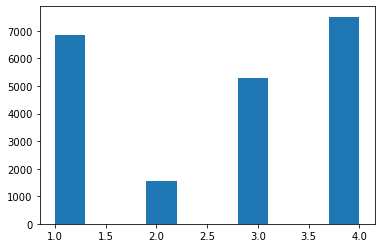

In [ ]:
plt.hist(df['Cluster'])

## Adding the calendar and temperature features to the dataframe

In [ ]:
df=df.set_index('date_time')
print(df)

                     conso_global  Hour  Cluster
date_time                                       
2017-09-01 00:00:00        0.3398     0        4
2017-09-01 01:00:00        0.3506     1        4
2017-09-01 02:00:00        0.1494     2        4
2017-09-01 03:00:00        0.1602     3        4
2017-09-01 04:00:00        0.4804     4        4
...                           ...   ...      ...
2020-01-31 19:00:00        0.9999    19        2
2020-01-31 20:00:00        0.1700    20        2
2020-01-31 21:00:00        0.5000    21        2
2020-01-31 22:00:00        0.5000    22        2
2020-01-31 23:00:00        0.5000    23        2

[21192 rows x 3 columns]


In [ ]:
temp = pd.read_csv('https://raw.githubusercontent.com/AlmudenaMaroto/OMP_1/main/Temperature_Grenoble_2016_20.csv',encoding="utf-8",sep=';')
temp.head()

,Unnamed: 0,DATE,TMP
0,0,2016-01-01 00:00:00,5.01
1,1,2016-01-01 01:00:00,5.01
2,2,2016-01-01 02:00:00,5.21
3,3,2016-01-01 03:00:00,5.21
4,4,2016-01-01 04:00:00,5.31


In [ ]:
temp = temp.drop(columns=['Unnamed: 0'])
temp['DATE']=pd.to_datetime(temp['DATE'],format='%Y-%m-%d %H:%M:%S')
df_temp = df.join(temp.set_index('DATE'),how='left')

df_temp = df_temp.reset_index()
df_temp.info()
print(df_temp)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21192 entries, 0 to 21191
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date_time     21192 non-null  datetime64[ns]
 1   conso_global  21192 non-null  float64       
 2   Hour          21192 non-null  int64         
 3   Cluster       21192 non-null  int64         
 4   TMP           20493 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(2)
memory usage: 827.9 KB
                date_time  conso_global  Hour  Cluster    TMP
0     2017-09-01 00:00:00        0.3398     0        4  14.61
1     2017-09-01 01:00:00        0.3506     1        4  14.61
2     2017-09-01 02:00:00        0.1494     2        4  14.71
3     2017-09-01 03:00:00        0.1602     3        4  14.81
4     2017-09-01 04:00:00        0.4804     4        4  14.51
...                   ...           ...   ...      ...    ...
21187 2020-01-31 19:00:00        0.99

In [ ]:
### Replace Nan value by the 24h previous value
Nan_count = 0
test_nan = df_temp["TMP"].isna()
for idx in range(len(df_temp)):
  if test_nan.loc[idx]:
    Nan_count+=1
    if idx<24:
      df_temp.loc[idx,"TMP"]=df_temp.loc[idx-1,"TMP"]
    else :
      df_temp.loc[idx,"TMP"]=df_temp.loc[idx-24,"TMP"]


### Replace Nan value by the previous valid temperature
# df_temp["TMP"].fillna(method='ffill', inplace=True)
# df_temp.info()

df_temp['Tmean'] = 0

time_inertia_temperature = 24

for idx in range(len(df_temp)):
  if idx < time_inertia_temperature :
    sum_temp = 0
    for i in range(0,time_inertia_temperature) :
      sum_temp+=df_temp.loc[i,"TMP"]
    df_temp.loc[idx,"Tmean"]=sum_temp/time_inertia_temperature

  else :
    sum_temp = 0
    for i in range(1,time_inertia_temperature+1):
      sum_temp += df_temp.loc[idx-i,"TMP"]
    df_temp.loc[idx,"Tmean"]=sum_temp/time_inertia_temperature



df = df_temp

df = df.reset_index()

df['Year'] = df['date_time'].dt.year
df['Month_name'] = df['date_time'].dt.month_name()
df['Weekday'] = df['date_time'].dt.day_name()
df['Day_number'] = df['date_time'].dt.day
df['Hour'] = df['date_time'].dt.hour


df = df.set_index('date_time')

In [ ]:
df[:30]

,index,conso_global,Hour,Cluster,TMP,Tmean,Year,Month_name,Weekday,Day_number
date_time,,,,,,,,,,
2017-09-01 00:00:00,0,0.3398,0,4,14.61,15.318333,2017,September,Friday,1
2017-09-01 01:00:00,1,0.3506,1,4,14.61,15.318333,2017,September,Friday,1
2017-09-01 02:00:00,2,0.1494,2,4,14.71,15.318333,2017,September,Friday,1
2017-09-01 03:00:00,3,0.1602,3,4,14.81,15.318333,2017,September,Friday,1
2017-09-01 04:00:00,4,0.4804,4,4,14.51,15.318333,2017,September,Friday,1
2017-09-01 05:00:00,5,1.5996,5,4,14.31,15.318333,2017,September,Friday,1
2017-09-01 06:00:00,6,0.7696,6,4,14.31,15.318333,2017,September,Friday,1
2017-09-01 07:00:00,7,0.7607,7,4,14.61,15.318333,2017,September,Friday,1
2017-09-01 08:00:00,8,1.6602,8,4,15.51,15.318333,2017,September,Friday,1


In [ ]:
df['Calendar'] = 1
# Interruptions every year:
#df.loc[df['Month_name'] == 'July', 'Calendar'] = 0
#df.loc[df['Month_name'] == 'August', 'Calendar'] = 0

df.loc[(df['Weekday'] == 'Saturday'), 'Calendar'] = 0 # Weekends
df.loc[(df['Weekday'] == 'Sunday'), 'Calendar'] = 0 # Weekends
#2016-17
df.loc[(df['Month_name'] == 'October') & (df['Day_number'] > 26) & (df['Year'] == 2016), 'Calendar'] = 0
df.loc[(df['Month_name'] == 'November') & (df['Day_number'] < 3) & (df['Year'] == 2016), 'Calendar'] = 0
df.loc[(df['Month_name'] == 'December') & (df['Day_number'] > 16) & (df['Year'] == 2016)  , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'January') & (df['Day_number'] < 3) & (df['Year'] == 2017)  , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'February') & (df['Day_number'] > 17) & (df['Day_number'] < 27) & (df['Year'] == 2017) , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'April') & (df['Day_number'] > 14) & (df['Day_number'] < 24) & (df['Year'] == 2017) , 'Calendar'] = 0
#2017-18
#df.loc[(df['Month_name'] == 'October') & (df['Day_number'] > 27) & (df['Year'] == 2017), 'Calendar'] = 0
#df.loc[(df['Month_name'] == 'November') & (df['Day_number'] < 6) & (df['Year'] == 2017), 'Calendar'] = 0
df.loc[(df['Month_name'] == 'December') & (df['Day_number'] > 16) & (df['Year'] == 2017)  , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'January') & (df['Day_number'] < 3) & (df['Year'] == 2018)  , 'Calendar'] = 0
#df.loc[(df['Month_name'] == 'February') & (df['Day_number'] > 16) & (df['Day_number'] < 26) & (df['Year'] == 2018) , 'Calendar'] = 0
#df.loc[(df['Month_name'] == 'April') & (df['Day_number'] > 13) & (df['Day_number'] < 23) & (df['Year'] == 2018) , 'Calendar'] = 0
#2018-19
#df.loc[(df['Month_name'] == 'October') & (df['Day_number'] > 26) & (df['Year'] == 2018), 'Calendar'] = 0
#df.loc[(df['Month_name'] == 'November') & (df['Day_number'] < 5) & (df['Year'] == 2018), 'Calendar'] = 0
df.loc[(df['Month_name'] == 'December') & (df['Day_number'] > 21) & (df['Year'] == 2018)  , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'January') & (df['Day_number'] < 3) & (df['Year'] == 2019)  , 'Calendar'] = 0
#df.loc[(df['Month_name'] == 'February') & (df['Day_number'] > 22)  & (df['Year'] == 2019) , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'March') & (df['Day_number'] < 4)  & (df['Year'] == 2019) , 'Calendar'] = 0
#df.loc[(df['Month_name'] == 'April') & (df['Day_number'] > 19) & (df['Day_number'] < 29) & (df['Year'] == 2019) , 'Calendar'] = 0
#2019-20
df.loc[(df['Month_name'] == 'August') & (df['Day_number'] < 13) & (df['Year'] == 2019), 'Calendar'] = 0
#df.loc[(df['Month_name'] == 'October') & (df['Day_number'] > 25) & (df['Year'] == 2019), 'Calendar'] = 0
#df.loc[(df['Month_name'] == 'November') & (df['Day_number'] < 4) & (df['Year'] == 2019), 'Calendar'] = 0
df.loc[(df['Month_name'] == 'December') & (df['Day_number'] > 20) & (df['Year'] == 2019)  , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'January') & (df['Day_number'] < 6) & (df['Year'] == 2020)  , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'February') & (df['Day_number'] > 21)  & (df['Year'] == 2020) , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'March') & (df['Day_number'] < 2)  & (df['Year'] == 2020) , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'April') & (df['Day_number'] > 17) & (df['Day_number'] < 27) & (df['Year'] == 2020) , 'Calendar'] = 0
# France quarantine
df.loc[(df['Month_name'] == 'March') & (df['Day_number'] > 16)  & (df['Year'] == 2020) , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'April')  & (df['Year'] == 2020) , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'May')  & (df['Year'] == 2020) , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'June')  & (df['Year'] == 2020) , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'September')  & (df['Year'] == 2020) , 'Calendar'] = 0
# At Night it close too:
df.loc[(df['Hour'] > 20 )  , 'Calendar'] = 0
df.loc[(df['Hour'] < 7 ), 'Calendar'] = 0

In [ ]:
df.head()

,index,conso_global,Hour,Cluster,TMP,Tmean,Year,Month_name,Weekday,Day_number,Calendar
date_time,,,,,,,,,,,
2017-09-01 00:00:00,0,0.3398,0,4,14.61,15.318333,2017,September,Friday,1,0
2017-09-01 01:00:00,1,0.3506,1,4,14.61,15.318333,2017,September,Friday,1,0
2017-09-01 02:00:00,2,0.1494,2,4,14.71,15.318333,2017,September,Friday,1,0
2017-09-01 03:00:00,3,0.1602,3,4,14.81,15.318333,2017,September,Friday,1,0
2017-09-01 04:00:00,4,0.4804,4,4,14.51,15.318333,2017,September,Friday,1,0


### Hourly Temp

In [ ]:
 #df = df.set_index('date_time')
 df.drop(columns=['Year','Month_name','Weekday','Day_number','Hour','Tmean'], inplace=True)

### Daily Temp

In [ ]:
 #df = df.set_index('date_time')
 df.drop(columns=['Year','Month_name','Weekday','Day_number','Hour','TMP'], inplace=True)

In [ ]:
df.head()

,index,conso_global,Cluster,TMP,Calendar
date_time,,,,,
2017-09-01 00:00:00,0,0.3398,4,14.61,0
2017-09-01 01:00:00,1,0.3506,4,14.61,0
2017-09-01 02:00:00,2,0.1494,4,14.71,0
2017-09-01 03:00:00,3,0.1602,4,14.81,0
2017-09-01 04:00:00,4,0.4804,4,14.51,0


In [ ]:
from pathlib import Path
filepath = Path('processed_data_TMP.csv')
df.to_csv(filepath)

In [ ]:
# Applying LightGBM method to the problem

df = pd.read_csv('processed_data_Tmean.csv')

In [ ]:
df = df.set_index('date_time')

### DA-RNN

In [ ]:
import torch
from torch import nn
from torch import Tensor
from torch import optim
import torch.nn.functional as F


In [ ]:
import pandas as pd
import numpy as np
import matplotlib as plt
%pylab inline

Populating the interactive namespace from numpy and matplotlib


/home/mohamed_b/.conda/envs/mohamed_env/lib/python3.8/site-packages/IPython/core/magics/pylab.py:159: UserWarning: pylab import has clobbered these variables: ['random', 'plt', 'datetime']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


In [ ]:
%cd Downloads/

/home/mohamed_b/Downloads


In [ ]:
data = pd.read_csv('processed_data_TMP.csv')
data.drop(columns=['index'],inplace=True)

In [ ]:
data.head()

,date_time,conso_global,Cluster,TMP,Calendar
0,2017-09-01 00:00:00,0.3398,4,14.61,0
1,2017-09-01 01:00:00,0.3506,4,14.61,0
2,2017-09-01 02:00:00,0.1494,4,14.71,0
3,2017-09-01 03:00:00,0.1602,4,14.81,0
4,2017-09-01 04:00:00,0.4804,4,14.51,0


<AxesSubplot:>

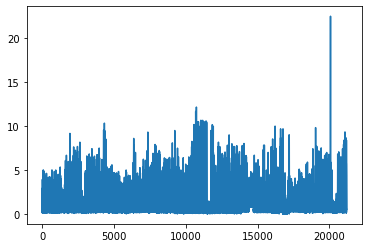

In [ ]:
data["conso_global"].plot()

In [ ]:
fig = px.line(data, x ='date_time', y = 'conso_global', title = 'Time series with slider')
fig.update_xaxes(rangeslider_visible = True)
fig.show()

In [ ]:
data['conso_lag_d7'] = data["conso_global"].shift(7*24)
data['cluster_lag_d7']= data['Cluster'].shift(7*24)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21192 entries, 0 to 21191
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   date_time       21192 non-null  object 
 1   conso_global    21192 non-null  float64
 2   Cluster         21192 non-null  int64  
 3   TMP             21192 non-null  float64
 4   Calendar        21192 non-null  int64  
 5   conso_lag_d7    21024 non-null  float64
 6   cluster_lag_d7  21024 non-null  float64
dtypes: float64(4), int64(2), object(1)
memory usage: 1.1+ MB


In [ ]:
data['conso_lag_d7'][:24*7] = data["conso_global"][:24*7]
data['cluster_lag_d7'][:24*7] = data["Cluster"][:24*7]

/tmp/ipykernel_3326876/4198149045.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_3326876/4198149045.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21192 entries, 0 to 21191
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   date_time       21192 non-null  object 
 1   conso_global    21192 non-null  float64
 2   Cluster         21192 non-null  int64  
 3   TMP             21192 non-null  float64
 4   Calendar        21192 non-null  int64  
 5   conso_lag_d7    21192 non-null  float64
 6   cluster_lag_d7  21192 non-null  float64
dtypes: float64(4), int64(2), object(1)
memory usage: 1.1+ MB


In [ ]:
data.drop(columns=['Cluster','Calendar'],inplace=True)

In [ ]:
data.head()

,date_time,conso_global,TMP,conso_lag_d7,cluster_lag_d7
0,2017-09-01 00:00:00,0.3398,14.61,0.3398,4.0
1,2017-09-01 01:00:00,0.3506,14.61,0.3506,4.0
2,2017-09-01 02:00:00,0.1494,14.71,0.1494,4.0
3,2017-09-01 03:00:00,0.1602,14.81,0.1602,4.0
4,2017-09-01 04:00:00,0.4804,14.51,0.4804,4.0


In [ ]:
data = data.set_index('date_time')
data.head()

,conso_global,TMP,conso_lag_d7,cluster_lag_d7
date_time,,,,
2017-09-01 00:00:00,0.3398,14.61,0.3398,4.0
2017-09-01 01:00:00,0.3506,14.61,0.3506,4.0
2017-09-01 02:00:00,0.1494,14.71,0.1494,4.0
2017-09-01 03:00:00,0.1602,14.81,0.1602,4.0
2017-09-01 04:00:00,0.4804,14.51,0.4804,4.0


In [ ]:
new_cols = ['conso_lag_d7', 'cluster_lag_d7','TMP','conso_global']
data1=data[new_cols]
#or
data1=data1.reindex(columns=new_cols)
data1.head()

,conso_lag_d7,cluster_lag_d7,TMP,conso_global
date_time,,,,
2017-09-01 00:00:00,0.3398,4.0,14.61,0.3398
2017-09-01 01:00:00,0.3506,4.0,14.61,0.3506
2017-09-01 02:00:00,0.1494,4.0,14.71,0.1494
2017-09-01 03:00:00,0.1602,4.0,14.81,0.1602
2017-09-01 04:00:00,0.4804,4.0,14.51,0.4804


In [ ]:
batch_size = 128
timesteps = 24
n_timeseries = data1.shape[1]-1
train_length = 11206
val_length = 4990
test_length = 4993
target = "conso_global"

In [ ]:
X = np.zeros((len(data1), timesteps, data1.shape[1]-1))
y = np.zeros((len(data1), timesteps, 1))

In [ ]:
lagged = ['conso_lag_d7', 'cluster_lag_d7','TMP']

In [ ]:
for i, name in enumerate(lagged):
    for j in range(timesteps):
        X[:, j, i] = data1[name].shift(timesteps - j - 1).fillna(method="bfill")

In [ ]:
for j in range(timesteps):
    y[:, j, 0] = data1["conso_global"].shift(timesteps - j - 1).fillna(method="bfill")

In [ ]:
prediction_horizon = 1
target = data1["conso_global"].shift(-prediction_horizon).fillna(method="ffill").values

In [ ]:
target.shape

(21192,)

In [ ]:
X = X[timesteps:]
y = y[timesteps:]
target = target[timesteps:]

In [ ]:
X_train = X[:train_length]
y_his_train = y[:train_length]
X_val = X[train_length:train_length+val_length]
y_his_val = y[train_length:train_length+val_length]
X_test = X[-val_length:]
y_his_test = y[-val_length:]
target_train = target[:train_length]
target_val = target[train_length:train_length+val_length]
target_test = target[-val_length:]

In [ ]:
X_train_max = X_train.max(axis=0)
X_train_min = X_train.min(axis=0)
y_his_train_max = y_his_train.max(axis=0)
y_his_train_min = y_his_train.min(axis=0)
target_train_max = target_train.max(axis=0)
target_train_min = target_train.min(axis=0)

In [ ]:
target

array([0.0899, 0.29  , 0.9092, ..., 0.5   , 0.5   , 0.5   ])

In [ ]:
X_train = (X_train - X_train_min) / (X_train_max - X_train_min)
X_val = (X_val - X_train_min) / (X_train_max - X_train_min)
X_test = (X_test - X_train_min) / (X_train_max - X_train_min)

y_his_train = (y_his_train - y_his_train_min) / (y_his_train_max - y_his_train_min)
y_his_val = (y_his_val - y_his_train_min) / (y_his_train_max - y_his_train_min)
y_his_test = (y_his_test - y_his_train_min) / (y_his_train_max - y_his_train_min)

target_train = (target_train - target_train_min) / (target_train_max - target_train_min)
target_val = (target_val - target_train_min) / (target_train_max - target_train_min)
target_test = (target_test - target_train_min) / (target_train_max - target_train_min)

In [ ]:
X_train_t = torch.Tensor(X_train)
X_val_t = torch.Tensor(X_val)
X_test_t = torch.Tensor(X_test)
y_his_train_t = torch.Tensor(y_his_train)
y_his_val_t = torch.Tensor(y_his_val)
y_his_test_t = torch.Tensor(y_his_test)
target_train_t = torch.Tensor(target_train)
target_val_t = torch.Tensor(target_val)
target_test_t = torch.Tensor(target_test)

In [ ]:
class InputAttentionEncoder(nn.Module):
    def __init__(self, N, M, T, stateful=False):
        """
        :param: N: int
            number of time serieses
        :param: M:
            number of LSTM units
        :param: T:
            number of timesteps
        :param: stateful:
            decides whether to initialize cell state of new time window with values of the last cell state
            of previous time window or to initialize it with zeros
        """
        super(self.__class__, self).__init__()
        self.N = N
        self.M = M
        self.T = T

        self.encoder_lstm = nn.LSTMCell(input_size=self.N, hidden_size=self.M)

        #equation 8 matrices

        self.W_e = nn.Linear(2*self.M, self.T)
        self.U_e = nn.Linear(self.T, self.T, bias=False)
        self.v_e = nn.Linear(self.T, 1, bias=False)

    def forward(self, inputs):
        encoded_inputs = torch.zeros((inputs.size(0), self.T, self.M)).cuda()

        #initiale hidden states
        h_tm1 = torch.zeros((inputs.size(0), self.M)).cuda()
        s_tm1 = torch.zeros((inputs.size(0), self.M)).cuda()

        for t in range(self.T):
            #concatenate hidden states
            h_c_concat = torch.cat((h_tm1, s_tm1), dim=1)

            #attention weights for each k in N (equation 8)
            x = self.W_e(h_c_concat).unsqueeze_(1).repeat(1, self.N, 1)
            y = self.U_e(inputs.permute(0, 2, 1))
            z = torch.tanh(x + y)
            e_k_t = torch.squeeze(self.v_e(z))

            #normalize attention weights (equation 9)
            alpha_k_t = F.softmax(e_k_t, dim=1)

            #weight inputs (equation 10)
            weighted_inputs = alpha_k_t * inputs[:, t, :]

            #calculate next hidden states (equation 11)
            h_tm1, s_tm1 = self.encoder_lstm(weighted_inputs, (h_tm1, s_tm1))

            encoded_inputs[:, t, :] = h_tm1
        return encoded_inputs

In [ ]:
class TemporalAttentionDecoder(nn.Module):
    def __init__(self, M, P, T, stateful=False):
        """
        :param: M: int
            number of encoder LSTM units
        :param: P:
            number of deocder LSTM units
        :param: T:
            number of timesteps
        :param: stateful:
            decides whether to initialize cell state of new time window with values of the last cell state
            of previous time window or to initialize it with zeros
        """
        super(self.__class__, self).__init__()
        self.M = M
        self.P = P
        self.T = T
        self.stateful = stateful

        self.decoder_lstm = nn.LSTMCell(input_size=1, hidden_size=self.P)

        #equation 12 matrices
        self.W_d = nn.Linear(2*self.P, self.M)
        self.U_d = nn.Linear(self.M, self.M, bias=False)
        self.v_d = nn.Linear(self.M, 1, bias = False)

        #equation 15 matrix
        self.w_tilda = nn.Linear(self.M + 1, 1)

        #equation 22 matrices
        self.W_y = nn.Linear(self.P + self.M, self.P)
        self.v_y = nn.Linear(self.P, 1)

    def forward(self, encoded_inputs, y):

        #initializing hidden states
        d_tm1 = torch.zeros((encoded_inputs.size(0), self.P)).cuda()
        s_prime_tm1 = torch.zeros((encoded_inputs.size(0), self.P)).cuda()
        for t in range(self.T):
            #concatenate hidden states
            d_s_prime_concat = torch.cat((d_tm1, s_prime_tm1), dim=1)
            #print(d_s_prime_concat)
            #temporal attention weights (equation 12)
            x1 = self.W_d(d_s_prime_concat).unsqueeze_(1).repeat(1, encoded_inputs.shape[1], 1)
            y1 = self.U_d(encoded_inputs)
            z1 = torch.tanh(x1 + y1)
            l_i_t = self.v_d(z1)

            #normalized attention weights (equation 13)
            beta_i_t = F.softmax(l_i_t, dim=1)

            #create context vector (equation_14)
            c_t = torch.sum(beta_i_t * encoded_inputs, dim=1)

            #concatenate c_t and y_t
            y_c_concat = torch.cat((c_t, y[:, t, :]), dim=1)
            #create y_tilda
            y_tilda_t = self.w_tilda(y_c_concat)

            #calculate next hidden states (equation 16)
            d_tm1, s_prime_tm1 = self.decoder_lstm(y_tilda_t, (d_tm1, s_prime_tm1))

        #concatenate context vector at step T and hidden state at step T
        d_c_concat = torch.cat((d_tm1, c_t), dim=1)

        #calculate output
        y_Tp1 = self.v_y(self.W_y(d_c_concat))
        return y_Tp1

In [ ]:
class DARNN(nn.Module):
    def __init__(self, N, M, P, T, stateful_encoder=False, stateful_decoder=False):
        super(self.__class__, self).__init__()
        self.encoder = InputAttentionEncoder(N, M, T, stateful_encoder).cuda()
        self.decoder = TemporalAttentionDecoder(M, P, T, stateful_decoder).cuda()
    def forward(self, X_history, y_history):
        out = self.decoder(self.encoder(X_history), y_history)
        return out

In [ ]:
model = DARNN(X_train.shape[2], 64, 64, X_train.shape[1]).cuda()
opt = torch.optim.Adam(model.parameters(), lr=0.001)

In [ ]:
epoch_scheduler = torch.optim.lr_scheduler.StepLR(opt, 20, gamma=0.9)

In [ ]:
from torch.utils.data import TensorDataset, DataLoader
data_train_loader = DataLoader(TensorDataset(X_train_t, y_his_train_t, target_train_t), shuffle=True, batch_size=128)
data_val_loader = DataLoader(TensorDataset(X_val_t, y_his_val_t, target_val_t), shuffle=False, batch_size=128)
data_test_loader = DataLoader(TensorDataset(X_test_t, y_his_test_t, target_test_t), shuffle=False, batch_size=128)

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

Saving...
Iter:  0 train:  0.14396359370172201 val:  0.13925290141324811
mse:  2.8720348 mae:  1.2066222


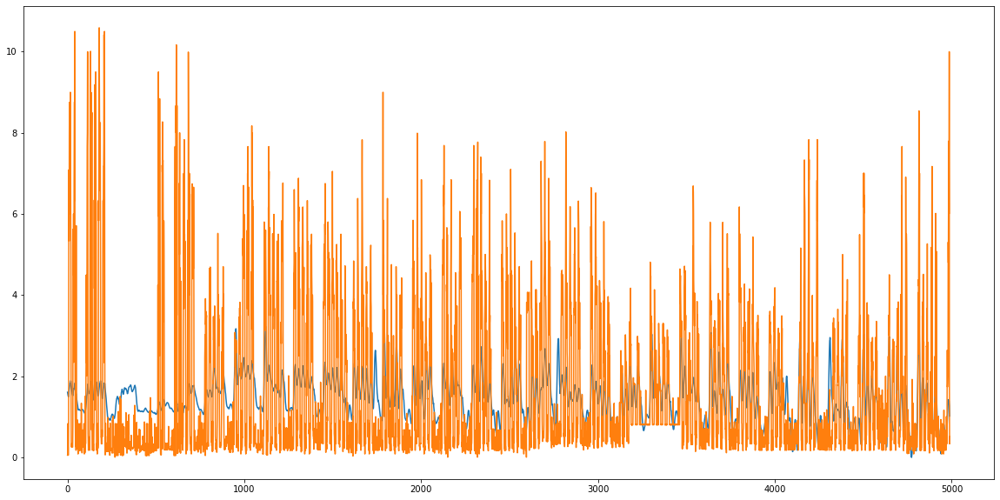

Saving...
Iter:  1 train:  0.11509176720610327 val:  0.0967051289944521
Saving...
Iter:  2 train:  0.08580801152006177 val:  0.09237883726410041
Saving...
Iter:  3 train:  0.08042688767629108 val:  0.09095710382922705
Saving...
Iter:  4 train:  0.07822849989804545 val:  0.0878739758072903
Saving...
Iter:  5 train:  0.07582409288146313 val:  0.08532789270930437
Saving...
Iter:  6 train:  0.07374169747364336 val:  0.08452762997794176
Iter:  7 train:  0.07289977147715954 val:  0.0855808926152326
Saving...
Iter:  8 train:  0.07230681119195817 val:  0.08306187574448426
Iter:  9 train:  0.0718764266219437 val:  0.08363165725824045
Iter:  10 train:  0.07195616580022648 val:  0.08535461947300153
mse:  1.0790342 mae:  0.6414927


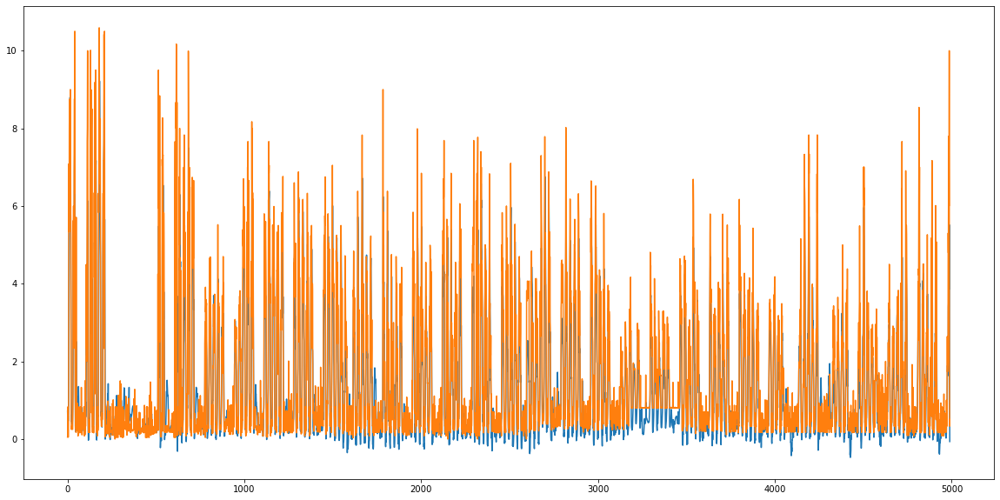

Saving...
Iter:  11 train:  0.07151020185033541 val:  0.08237570742265468
Iter:  12 train:  0.07112878438832199 val:  0.08471585032345752
Iter:  13 train:  0.07085477304617666 val:  0.08258849046359014
Saving...
Iter:  14 train:  0.07074861195513071 val:  0.08160390710859898
Iter:  15 train:  0.07024422231860109 val:  0.08232619782831888
Saving...
Iter:  16 train:  0.0704352078289857 val:  0.08102400397649293
Iter:  17 train:  0.07001620799960617 val:  0.08323208546931903
Iter:  18 train:  0.06872977401442326 val:  0.08272556741771743
Saving...
Iter:  19 train:  0.06800815068962035 val:  0.08030367664497223
Iter:  20 train:  0.067852544685884 val:  0.08337658594093486
mse:  1.0296019 mae:  0.6049404


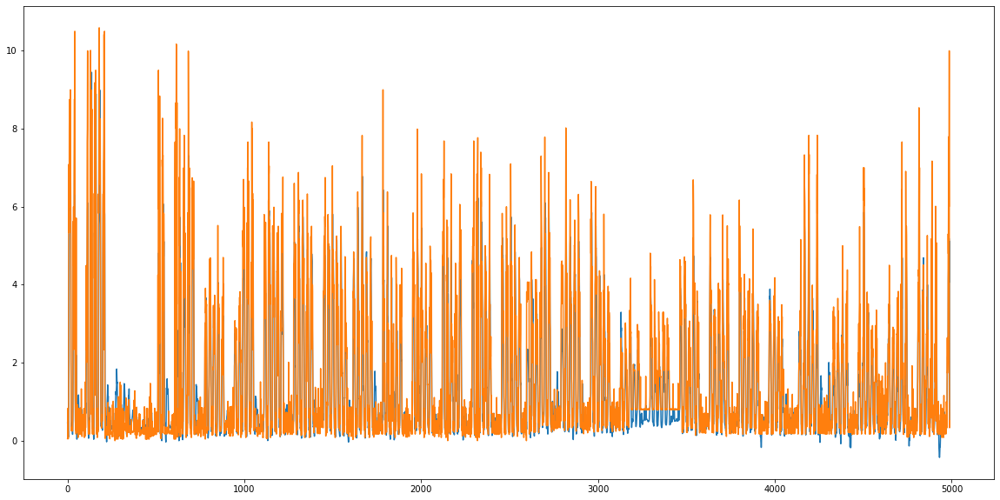

Saving...
Iter:  21 train:  0.06742352329610449 val:  0.07971169291190727
Iter:  22 train:  0.06737588514641339 val:  0.08190902948014699
Iter:  23 train:  0.06715273726664918 val:  0.08049325212077037
Iter:  24 train:  0.06637799213825865 val:  0.08297127323638173
Iter:  25 train:  0.06704299707521687 val:  0.08377959169558763
Iter:  26 train:  0.06593017577245125 val:  0.08129826050868254
Iter:  27 train:  0.06575571682036557 val:  0.0802712267953072
Iter:  28 train:  0.06645241198917823 val:  0.08127779851841042
Iter:  29 train:  0.06528126020277006 val:  0.08177210484781428
Iter:  30 train:  0.06588718420855579 val:  0.08005014179585798
mse:  0.9490856 mae:  0.5970349


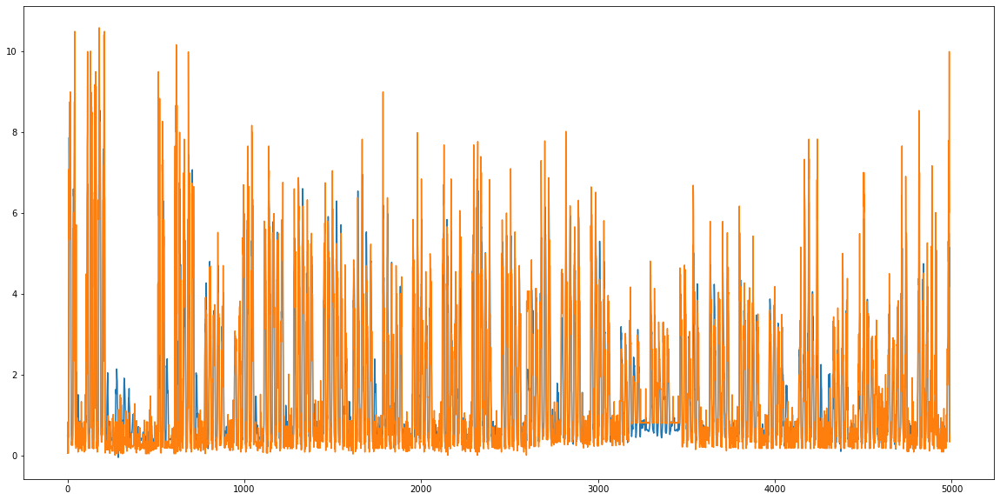

Iter:  31 train:  0.06502885837006256 val:  0.08000137649637973
Saving...
Iter:  32 train:  0.06497964786819758 val:  0.07867458784009893
Iter:  33 train:  0.06473958683997844 val:  0.08035064964311023
Iter:  34 train:  0.06496421483642092 val:  0.08054967416120257
Iter:  35 train:  0.06542457360393136 val:  0.08062765059601161
Iter:  36 train:  0.06438093147929903 val:  0.08030970755290945
Iter:  37 train:  0.06447586330331492 val:  0.08086359187448859
Iter:  38 train:  0.06467019356889969 val:  0.08178947580172877
Iter:  39 train:  0.06537353488323 val:  0.0808989948634377
Iter:  40 train:  0.06340541797619519 val:  0.08051488868770572
mse:  0.9601378 mae:  0.6229103


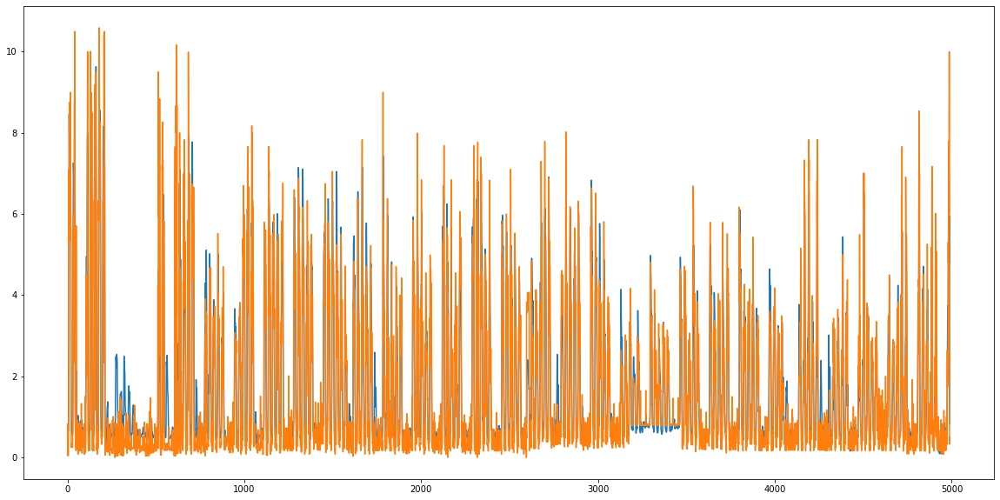

Iter:  41 train:  0.06423653249723113 val:  0.07979726213372652
Iter:  42 train:  0.06381387534058555 val:  0.08077216529707383
Iter:  43 train:  0.0634891302533061 val:  0.08149176729809571
Iter:  44 train:  0.06376355470066017 val:  0.078756753782813
Iter:  45 train:  0.06372090366925592 val:  0.08180200910868517
Saving...
Iter:  46 train:  0.06395053129632033 val:  0.07852934802457595
Iter:  47 train:  0.06334226545677836 val:  0.08370369274980294
Iter:  48 train:  0.06344488214975855 val:  0.08067049919012348
Iter:  49 train:  0.06329264192890323 val:  0.08411565180627477
Iter:  50 train:  0.06316376516993653 val:  0.08118906654476327
mse:  0.9762842 mae:  0.6046052


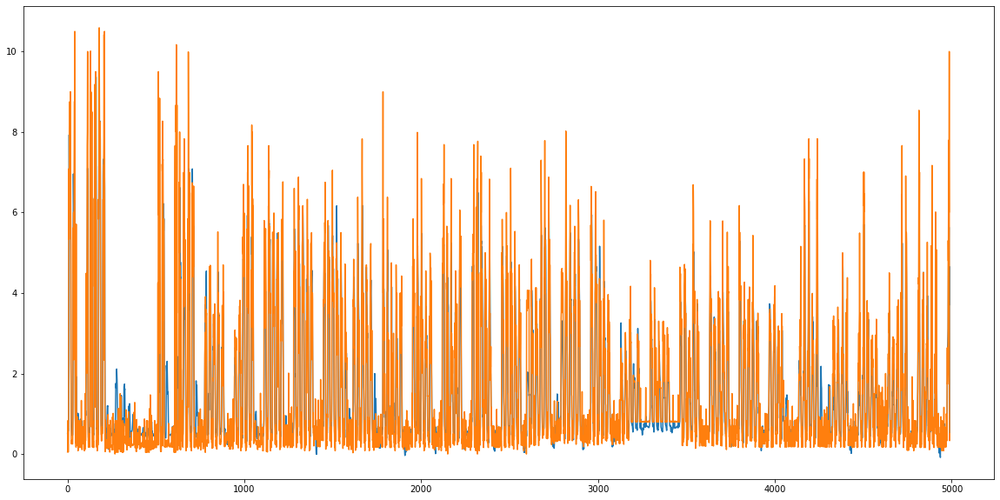

Iter:  51 train:  0.06268186553026783 val:  0.08145820490858934
Iter:  52 train:  0.06345559776508662 val:  0.0812050158101148
Iter:  53 train:  0.06341583680993929 val:  0.07947773322584926
Iter:  54 train:  0.06335978642887442 val:  0.08196465226688239
Iter:  55 train:  0.062493605690149674 val:  0.07882319877259748
Iter:  56 train:  0.06276047791426505 val:  0.08060521016540159
Iter:  57 train:  0.06255186378856784 val:  0.07931311457114562
Iter:  58 train:  0.06273239039143465 val:  0.0795956765051276
Iter:  59 train:  0.0630540608771646 val:  0.07974296699724089
Iter:  60 train:  0.062272282600430356 val:  0.07953321502001838
mse:  0.9368676 mae:  0.57653564


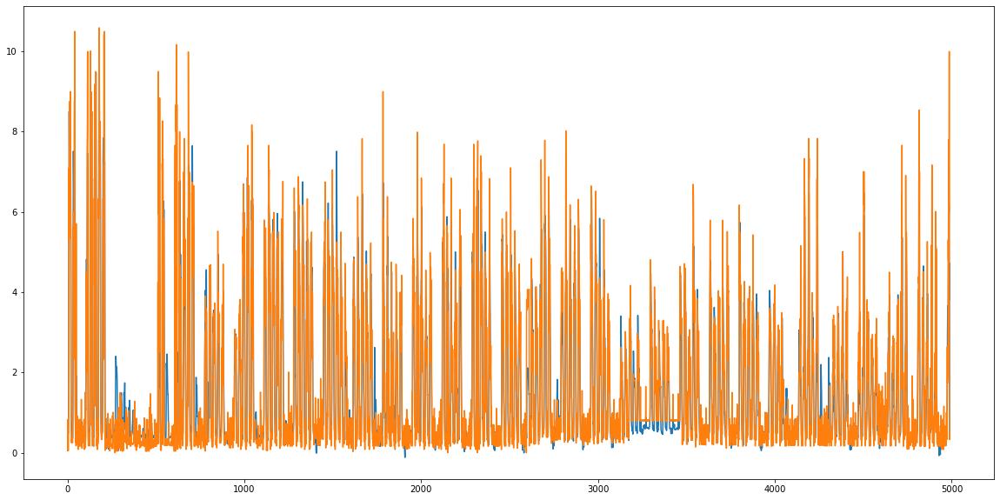

In [ ]:
epochs = 150
loss = nn.MSELoss()
patience = 15
min_val_loss = 9999
counter = 0
for i in range(epochs):
    mse_train = 0
    for batch_x, batch_y_h, batch_y in data_train_loader :
        batch_x = batch_x.cuda()
        batch_y = batch_y.cuda()
        batch_y_h = batch_y_h.cuda()
        opt.zero_grad()
        y_pred = model(batch_x, batch_y_h)
        y_pred = y_pred.squeeze(1)
        l = loss(y_pred, batch_y)
        l.backward()
        mse_train += l.item()*batch_x.shape[0]
        opt.step()
    epoch_scheduler.step()
    with torch.no_grad():
        mse_val = 0
        preds = []
        true = []
        for batch_x, batch_y_h, batch_y in data_val_loader:
            batch_x = batch_x.cuda()
            batch_y = batch_y.cuda()
            batch_y_h = batch_y_h.cuda()
            output = model(batch_x, batch_y_h)
            output = output.squeeze(1)
            preds.append(output.detach().cpu().numpy())
            true.append(batch_y.detach().cpu().numpy())
            mse_val += loss(output, batch_y).item()*batch_x.shape[0]
    preds = np.concatenate(preds)
    true = np.concatenate(true)

    if min_val_loss > mse_val**0.5:
        min_val_loss = mse_val**0.5
        print("Saving...")
        torch.save(model.state_dict(), "model.pt")
        counter = 0
    else:
        counter += 1

    if counter == patience:
        break
    print("Iter: ", i, "train: ", (mse_train/len(X_train_t))**0.5, "val: ", (mse_val/len(X_val_t))**0.5)
    if(i % 10 == 0):
        preds = preds*(target_train_max - target_train_min) + target_train_min
        true = true*(target_train_max - target_train_min) + target_train_min
        mse = mean_squared_error(true, preds)
        mae = mean_absolute_error(true, preds)
        print("mse: ", mse, "mae: ", mae)
        plt.figure(figsize=(20, 10))
        plt.plot(preds)
        plt.plot(true)
        plt.show()

In [ ]:
!ls

 Copy_of_DARNN_NASDAQ.ipynb	    model.pt
 DA-RNN				    processed_data2.csv
 darnn_nasdaq.pt		    processed_data.csv
'Load_forecasting(1).ipynb'	    processed_data_Tmean.csv
'load forecasting + DA-RNN.ipynb'   processed_data_TMP.csv
 Load_forecasting.ipynb		    traineddarnn.pt


In [ ]:
model.load_state_dict(torch.load("model.pt"))

<All keys matched successfully>

In [ ]:
with torch.no_grad():
    mse_val = 0
    preds = []
    true = []
    for batch_x, batch_y_h, batch_y in data_test_loader:
        batch_x = batch_x.cuda()
        batch_y = batch_y.cuda()
        batch_y_h = batch_y_h.cuda()
        output = model(batch_x, batch_y_h)
        preds.append(output.detach().cpu().numpy())
        true.append(batch_y.detach().cpu().numpy())
        mse_val += loss(output, batch_y).item()*batch_x.shape[0]
preds = np.concatenate(preds)
true = np.concatenate(true)

/home/mohamed_b/.conda/envs/mohamed_env/lib/python3.8/site-packages/torch/nn/modules/loss.py:520: UserWarning:

Using a target size (torch.Size([128])) that is different to the input size (torch.Size([128, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.

/home/mohamed_b/.conda/envs/mohamed_env/lib/python3.8/site-packages/torch/nn/modules/loss.py:520: UserWarning:

Using a target size (torch.Size([126])) that is different to the input size (torch.Size([126, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



In [ ]:
true.shape

(4990,)

In [ ]:
preds = preds*(target_train_max - target_train_min) + target_train_min
true = true*(target_train_max - target_train_min) + target_train_min

In [ ]:
mse = mean_squared_error(true, preds)
mae = mean_absolute_error(true, preds)

In [ ]:
mse, mae

(0.75100833, 0.55921435)

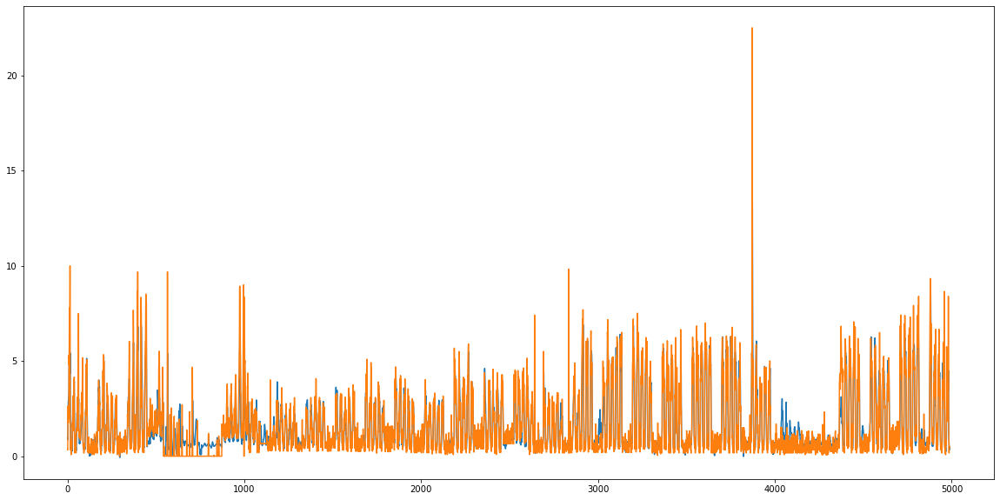

In [ ]:
plt.figure(figsize=(20, 10))
plt.plot(preds)
plt.plot(true)
plt.show()

In [ ]:
r2_score(true[1400:],preds[1400:])

0.7719825553876725

# Applying LightGBM method to the problem

## Finding the best hyperparameters combination

In [ ]:
!ls

 Copy_of_DARNN_NASDAQ.ipynb	    Load_forecasting.ipynb
 DA-RNN				    processed_data2.csv
 darnn_nasdaq.pt		    processed_data.csv
'Load_forecasting(1).ipynb'	    processed_data_Tmean.csv
'load forecasting + DA-RNN.ipynb'   processed_data_TMP.csv


In [ ]:
hours2predict=24
hourslag=24

In [ ]:
lags = np.arange(1,hourslag+1)
lags

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24])

In [ ]:
leads = np.arange(hours2predict-1)
lead_cols = [f"conso_lead_{lead+1}" for lead in leads ]
lead_cols_cal = [f"calendar_lead_{lead+1}" for lead in leads]
for lead, lead_col in zip(leads, lead_cols):
    df[lead_col] = df["conso_global"].shift(-(lead+1))

## Calendar
for lead, lead_col in zip(leads,lead_cols_cal):
    df[lead_col] = df["Calendar"].shift(-(lead+1))

lags = np.arange(1,hourslag+1)
lag_cols = [f"conso_lag_{lag}" for lag in lags ]
for lag, lag_col in zip(lags, lag_cols):
    df[lag_col] = df["conso_global"].shift(lag)

### J-7

# lags_d7 = np.arange(1,hourslag+1)
# lag_cols_d7 = [f"conso_lag_d7_{lag}" for lag in lags_d7]
# for lag, lag_col in zip(lags_d7, lag_cols_d7):
#     df[lag_col] = df["conso_global"].shift(lag+6*24)

lags_d7 = np.arange(0,hourslag)
lag_cols_d7 = [f"conso_lag_d7_{lag}" for lag in lags_d7]
for lag, lag_col in zip(lags_d7, lag_cols_d7):
    df[lag_col] = df["conso_global"].shift(7*24-lag)

# conso_lag_d7_0 : same hour we are currently but one week before
# conso_lag_d7_23 : same hour than the hour to predict +23 but one week before

## TEMPERATURE
lead_cols_temperature = [f"Tmean_lead_{lead+1}" for lead in leads]
for lead, lead_col in zip(leads,lead_cols_temperature):
    df[lead_col] = df["Tmean"].shift(-(lead+1))

#lead_cols_temperature = [f"TMP_lead_{lead+1}" for lead in leads]
#for lead, lead_col in zip(leads,lead_cols_temperature):
#    df[lead_col] = df["TMP"].shift(-(lead+1))
## lags J-7 cluster

lag_cols_clust = [f"clust_lag_d7_{lag}" for lag in lags_d7]
for lag, lag_col in zip(lags_d7, lag_cols_clust):
    df[lag_col] = df["Cluster"].shift(7*24-lag)





/tmp/ipykernel_3278415/1702541981.py:34: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_3278415/1702541981.py:43: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`



In [ ]:
df.rename(columns={"conso_global": "conso_lead_0"}, inplace= True)
df.rename(columns={"Calendar":"calendar_lead_0"},inplace=True)
df.rename(columns={"Tmean":"Tmean_lead_0"},inplace = True)

In [ ]:

df.drop(columns=['index'],inplace=True)
df.head()

,conso_lead_0,Cluster,Tmean_lead_0,calendar_lead_0,conso_lead_1,conso_lead_2,conso_lead_3,conso_lead_4,conso_lead_5,conso_lead_6,...,clust_lag_d7_14,clust_lag_d7_15,clust_lag_d7_16,clust_lag_d7_17,clust_lag_d7_18,clust_lag_d7_19,clust_lag_d7_20,clust_lag_d7_21,clust_lag_d7_22,clust_lag_d7_23
date_time,,,,,,,,,,,,,,,,,,,,,
2017-09-01 00:00:00,0.3398,4,15.318333,0,0.3506,0.1494,0.1602,0.4804,1.5996,0.7696,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-09-01 01:00:00,0.3506,4,15.318333,0,0.1494,0.1602,0.4804,1.5996,0.7696,0.7607,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-09-01 02:00:00,0.1494,4,15.318333,0,0.1602,0.4804,1.5996,0.7696,0.7607,1.6602,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-09-01 03:00:00,0.1602,4,15.318333,0,0.4804,1.5996,0.7696,0.7607,1.6602,1.3993,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-09-01 04:00:00,0.4804,4,15.318333,0,1.5996,0.7696,0.7607,1.6602,1.3993,1.4102,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
print(df.columns[:100])
print(df.columns[100:])

Index(['conso_lead_0', 'Cluster', 'Tmean_lead_0', 'calendar_lead_0',
       'conso_lead_1', 'conso_lead_2', 'conso_lead_3', 'conso_lead_4',
       'conso_lead_5', 'conso_lead_6', 'conso_lead_7', 'conso_lead_8',
       'conso_lead_9', 'conso_lead_10', 'conso_lead_11', 'conso_lead_12',
       'conso_lead_13', 'conso_lead_14', 'conso_lead_15', 'conso_lead_16',
       'conso_lead_17', 'conso_lead_18', 'conso_lead_19', 'conso_lead_20',
       'conso_lead_21', 'conso_lead_22', 'conso_lead_23', 'calendar_lead_1',
       'calendar_lead_2', 'calendar_lead_3', 'calendar_lead_4',
       'calendar_lead_5', 'calendar_lead_6', 'calendar_lead_7',
       'calendar_lead_8', 'calendar_lead_9', 'calendar_lead_10',
       'calendar_lead_11', 'calendar_lead_12', 'calendar_lead_13',
       'calendar_lead_14', 'calendar_lead_15', 'calendar_lead_16',
       'calendar_lead_17', 'calendar_lead_18', 'calendar_lead_19',
       'calendar_lead_20', 'calendar_lead_21', 'calendar_lead_22',
       'calendar_lead_23', 

In [ ]:
df.drop(columns=['Cluster'],inplace=True)

In [ ]:
df.dropna(inplace=True)
print(len(df))

21001


In [ ]:
df.head()

,conso_lead_0,Tmean_lead_0,calendar_lead_0,conso_lead_1,conso_lead_2,conso_lead_3,conso_lead_4,conso_lead_5,conso_lead_6,conso_lead_7,...,clust_lag_d7_14,clust_lag_d7_15,clust_lag_d7_16,clust_lag_d7_17,clust_lag_d7_18,clust_lag_d7_19,clust_lag_d7_20,clust_lag_d7_21,clust_lag_d7_22,clust_lag_d7_23
date_time,,,,,,,,,,,,,,,,,,,,,
2017-09-08 00:00:00,0.1201,17.439167,0,0.1299,0.7305,0.2598,0.2597,0.2608,0.2597,2.2003,...,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0
2017-09-08 01:00:00,0.1299,17.314167,0,0.7305,0.2598,0.2597,0.2608,0.2597,2.2003,3.1699,...,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0
2017-09-08 02:00:00,0.7305,17.235000,0,0.2598,0.2597,0.2608,0.2597,2.2003,3.1699,2.7802,...,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0,1.0
2017-09-08 03:00:00,0.2598,17.080833,0,0.2597,0.2608,0.2597,2.2003,3.1699,2.7802,3.4492,...,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0,1.0,1.0
2017-09-08 04:00:00,0.2597,16.905833,0,0.2608,0.2597,2.2003,3.1699,2.7802,3.4492,1.6104,...,4.0,4.0,4.0,4.0,4.0,4.0,1.0,1.0,1.0,1.0


## Not needed for now ( to investigate )

In [ ]:
#Scaling
scaler = MinMaxScaler()
df['conso_lead_0'] = scaler.fit_transform(pd.DataFrame(df['conso_lead_0']))

leads = np.arange(23)
lead_cols = [f"conso_lead_{lead+1}" for lead in leads ]
for lead, lead_col in zip(leads, lead_cols):
    df[lead_col] = scaler.transform(pd.DataFrame(df[lead_col]))


lags = np.arange(1,hourslag+1)
lag_cols = [f"conso_lag_{lag}" for lag in lags ]
for lag_col in lag_cols:
    df[lag_col] = scaler.transform(pd.DataFrame(df[lag_col]))


lags_d7 = np.arange(0,hourslag)
lag_cols_d7 = [f"conso_lag_d7_{lag}" for lag in lags_d7]
for lag_col in lag_cols_d7:
    df[lag_col] = scaler.transform(pd.DataFrame(df[lag_col]))



/home/mohamed_b/.conda/envs/mohamed_env/lib/python3.8/site-packages/sklearn/base.py:488: FutureWarning:

The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- conso_lead_1
Feature names seen at fit time, yet now missing:
- conso_lead_0


/home/mohamed_b/.conda/envs/mohamed_env/lib/python3.8/site-packages/sklearn/base.py:488: FutureWarning:

The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- conso_lead_2
Feature names seen at fit time, yet now missing:
- conso_lead_0


/home/mohamed_b/.conda/envs/mohamed_env/lib/python3.8/site-packages/sklearn/base.py:488: FutureWarning:

The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- conso_lead_3
Feature names seen at fit time, yet now missing:
- conso_lead_0


/

## Splitting

In [ ]:
train_data = df.iloc[0:16008]
test_data = df.iloc[16008:]

train_data.shape, test_data.shape

((16008, 144), (4993, 144))

In [ ]:
#from pathlib import Path
#filepath = Path('processed_data2.csv')
#df.to_csv(filepath)

In [ ]:
lead_cols.insert(0, "conso_lead_0")
lead_cols

['conso_lead_0',
 'conso_lead_1',
 'conso_lead_2',
 'conso_lead_3',
 'conso_lead_4',
 'conso_lead_5',
 'conso_lead_6',
 'conso_lead_7',
 'conso_lead_8',
 'conso_lead_9',
 'conso_lead_10',
 'conso_lead_11',
 'conso_lead_12',
 'conso_lead_13',
 'conso_lead_14',
 'conso_lead_15',
 'conso_lead_16',
 'conso_lead_17',
 'conso_lead_18',
 'conso_lead_19',
 'conso_lead_20',
 'conso_lead_21',
 'conso_lead_22',
 'conso_lead_23']

In [ ]:
x_train_data = train_data.drop(lead_cols, axis=1)
y_train_data = train_data.loc[:, lead_cols]
x_test_data = test_data.drop(lead_cols, axis=1)
y_test_data = test_data.loc[:, lead_cols]
x_test_data.head()

,Tmean_lead_0,calendar_lead_0,calendar_lead_1,calendar_lead_2,calendar_lead_3,calendar_lead_4,calendar_lead_5,calendar_lead_6,calendar_lead_7,calendar_lead_8,...,clust_lag_d7_14,clust_lag_d7_15,clust_lag_d7_16,clust_lag_d7_17,clust_lag_d7_18,clust_lag_d7_19,clust_lag_d7_20,clust_lag_d7_21,clust_lag_d7_22,clust_lag_d7_23
date_time,,,,,,,,,,,,,,,,,,,,,
2019-07-07 00:00:00,25.976667,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2019-07-07 01:00:00,26.035000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0
2019-07-07 02:00:00,26.093333,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0
2019-07-07 03:00:00,26.118333,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0
2019-07-07 04:00:00,26.118333,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0


In [ ]:
print(x_train_data.shape)
print(y_train_data.shape)

(16008, 120)
(16008, 24)


In [ ]:
print(x_test_data.index[1200])
print(x_test_data.shape)
print(4993-1200)

2019-08-26 00:00:00
(4993, 120)
3793


In [ ]:
import lightgbm as lgbm
from sklearn import metrics
from sklearn import model_selection

In [ ]:
print(lead_cols_cal)

['calendar_lead_1', 'calendar_lead_2', 'calendar_lead_3', 'calendar_lead_4', 'calendar_lead_5', 'calendar_lead_6', 'calendar_lead_7', 'calendar_lead_8', 'calendar_lead_9', 'calendar_lead_10', 'calendar_lead_11', 'calendar_lead_12', 'calendar_lead_13', 'calendar_lead_14', 'calendar_lead_15', 'calendar_lead_16', 'calendar_lead_17', 'calendar_lead_18', 'calendar_lead_19', 'calendar_lead_20', 'calendar_lead_21', 'calendar_lead_22', 'calendar_lead_23']


In [ ]:
x_train_data.columns

Index(['Tmean_lead_0', 'calendar_lead_0', 'calendar_lead_1', 'calendar_lead_2',
       'calendar_lead_3', 'calendar_lead_4', 'calendar_lead_5',
       'calendar_lead_6', 'calendar_lead_7', 'calendar_lead_8',
       ...
       'clust_lag_d7_14', 'clust_lag_d7_15', 'clust_lag_d7_16',
       'clust_lag_d7_17', 'clust_lag_d7_18', 'clust_lag_d7_19',
       'clust_lag_d7_20', 'clust_lag_d7_21', 'clust_lag_d7_22',
       'clust_lag_d7_23'],
      dtype='object', length=120)

In [ ]:
delete_cal = lead_cols_cal+['calendar_lead_0']+lag_cols_clust+lead_cols_temperature+['Tmean_lead_0']
train_data_new=train_data.drop(delete_cal,axis=1)

threshold = 0
features = []
for col in y_train_data.columns:
    correlation = pd.DataFrame(train_data_new.drop(lead_cols, axis=1).corrwith(train_data_new[col]), columns=['corr'])
    thresh_corr = correlation[correlation['corr']> threshold]
    features.append(list(thresh_corr.index))


In [ ]:
#features=list(train_data_new.drop(lead_cols, axis=1).columns)

In [ ]:

print(train_data_new)
print(delete_cal)
# print(features)
pd.DataFrame(features)

                     conso_lead_0  conso_lead_1  conso_lead_2  conso_lead_3  \
date_time                                                                     
2017-09-08 00:00:00      0.005333      0.005768      0.032439      0.011537   
2017-09-08 01:00:00      0.005768      0.032439      0.011537      0.011533   
2017-09-08 02:00:00      0.032439      0.011537      0.011533      0.011581   
2017-09-08 03:00:00      0.011537      0.011533      0.011581      0.011533   
2017-09-08 04:00:00      0.011533      0.011581      0.011533      0.097709   
...                           ...           ...           ...           ...   
2019-07-06 19:00:00      0.022648      0.011102      0.011102      0.022204   
2019-07-06 20:00:00      0.011102      0.011102      0.022204      0.003553   
2019-07-06 21:00:00      0.011102      0.022204      0.003553      0.003997   
2019-07-06 22:00:00      0.022204      0.003553      0.003997      0.036858   
2019-07-06 23:00:00      0.003553      0.003997     

,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,28
0,conso_lag_1,conso_lag_2,conso_lag_3,conso_lag_4,conso_lag_5,conso_lag_6,conso_lag_7,conso_lag_17,conso_lag_18,conso_lag_19,...,conso_lag_d7_4,conso_lag_d7_5,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_18,conso_lag_d7_19,conso_lag_d7_20,conso_lag_d7_21,conso_lag_d7_22,conso_lag_d7_23
1,conso_lag_1,conso_lag_2,conso_lag_3,conso_lag_4,conso_lag_5,conso_lag_6,conso_lag_16,conso_lag_17,conso_lag_18,conso_lag_19,...,conso_lag_d7_4,conso_lag_d7_5,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_19,conso_lag_d7_20,conso_lag_d7_21,conso_lag_d7_22,conso_lag_d7_23
2,conso_lag_1,conso_lag_2,conso_lag_3,conso_lag_4,conso_lag_5,conso_lag_15,conso_lag_16,conso_lag_17,conso_lag_18,conso_lag_19,...,conso_lag_d7_4,conso_lag_d7_5,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_9,conso_lag_d7_20,conso_lag_d7_21,conso_lag_d7_22,conso_lag_d7_23
3,conso_lag_1,conso_lag_2,conso_lag_3,conso_lag_4,conso_lag_14,conso_lag_15,conso_lag_16,conso_lag_17,conso_lag_18,conso_lag_19,...,conso_lag_d7_4,conso_lag_d7_5,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_9,conso_lag_d7_10,conso_lag_d7_21,conso_lag_d7_22,conso_lag_d7_23
4,conso_lag_1,conso_lag_2,conso_lag_3,conso_lag_13,conso_lag_14,conso_lag_15,conso_lag_16,conso_lag_17,conso_lag_18,conso_lag_19,...,conso_lag_d7_4,conso_lag_d7_5,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_9,conso_lag_d7_10,conso_lag_d7_11,conso_lag_d7_22,conso_lag_d7_23
5,conso_lag_1,conso_lag_2,conso_lag_12,conso_lag_13,conso_lag_14,conso_lag_15,conso_lag_16,conso_lag_17,conso_lag_18,conso_lag_19,...,conso_lag_d7_4,conso_lag_d7_5,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_9,conso_lag_d7_10,conso_lag_d7_11,conso_lag_d7_12,conso_lag_d7_23
6,conso_lag_1,conso_lag_11,conso_lag_12,conso_lag_13,conso_lag_14,conso_lag_15,conso_lag_16,conso_lag_17,conso_lag_18,conso_lag_19,...,conso_lag_d7_4,conso_lag_d7_5,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_9,conso_lag_d7_10,conso_lag_d7_11,conso_lag_d7_12,conso_lag_d7_13
7,conso_lag_10,conso_lag_11,conso_lag_12,conso_lag_13,conso_lag_14,conso_lag_15,conso_lag_16,conso_lag_17,conso_lag_18,conso_lag_19,...,conso_lag_d7_5,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_9,conso_lag_d7_10,conso_lag_d7_11,conso_lag_d7_12,conso_lag_d7_13,conso_lag_d7_14
8,conso_lag_9,conso_lag_10,conso_lag_11,conso_lag_12,conso_lag_13,conso_lag_14,conso_lag_15,conso_lag_16,conso_lag_17,conso_lag_18,...,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_9,conso_lag_d7_10,conso_lag_d7_11,conso_lag_d7_12,conso_lag_d7_13,conso_lag_d7_14,conso_lag_d7_15
9,conso_lag_8,conso_lag_9,conso_lag_10,conso_lag_11,conso_lag_12,conso_lag_13,conso_lag_14,conso_lag_15,conso_lag_16,conso_lag_17,...,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_9,conso_lag_d7_10,conso_lag_d7_11,conso_lag_d7_12,conso_lag_d7_13,conso_lag_d7_14,conso_lag_d7_15,conso_lag_d7_16


In [ ]:
pd.DataFrame(features)

,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,28
0,conso_lag_1,conso_lag_2,conso_lag_3,conso_lag_4,conso_lag_5,conso_lag_6,conso_lag_7,conso_lag_17,conso_lag_18,conso_lag_19,...,conso_lag_d7_4,conso_lag_d7_5,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_18,conso_lag_d7_19,conso_lag_d7_20,conso_lag_d7_21,conso_lag_d7_22,conso_lag_d7_23
1,conso_lag_1,conso_lag_2,conso_lag_3,conso_lag_4,conso_lag_5,conso_lag_6,conso_lag_16,conso_lag_17,conso_lag_18,conso_lag_19,...,conso_lag_d7_4,conso_lag_d7_5,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_19,conso_lag_d7_20,conso_lag_d7_21,conso_lag_d7_22,conso_lag_d7_23
2,conso_lag_1,conso_lag_2,conso_lag_3,conso_lag_4,conso_lag_5,conso_lag_15,conso_lag_16,conso_lag_17,conso_lag_18,conso_lag_19,...,conso_lag_d7_4,conso_lag_d7_5,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_9,conso_lag_d7_20,conso_lag_d7_21,conso_lag_d7_22,conso_lag_d7_23
3,conso_lag_1,conso_lag_2,conso_lag_3,conso_lag_4,conso_lag_14,conso_lag_15,conso_lag_16,conso_lag_17,conso_lag_18,conso_lag_19,...,conso_lag_d7_4,conso_lag_d7_5,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_9,conso_lag_d7_10,conso_lag_d7_21,conso_lag_d7_22,conso_lag_d7_23
4,conso_lag_1,conso_lag_2,conso_lag_3,conso_lag_13,conso_lag_14,conso_lag_15,conso_lag_16,conso_lag_17,conso_lag_18,conso_lag_19,...,conso_lag_d7_4,conso_lag_d7_5,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_9,conso_lag_d7_10,conso_lag_d7_11,conso_lag_d7_22,conso_lag_d7_23
5,conso_lag_1,conso_lag_2,conso_lag_12,conso_lag_13,conso_lag_14,conso_lag_15,conso_lag_16,conso_lag_17,conso_lag_18,conso_lag_19,...,conso_lag_d7_4,conso_lag_d7_5,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_9,conso_lag_d7_10,conso_lag_d7_11,conso_lag_d7_12,conso_lag_d7_23
6,conso_lag_1,conso_lag_11,conso_lag_12,conso_lag_13,conso_lag_14,conso_lag_15,conso_lag_16,conso_lag_17,conso_lag_18,conso_lag_19,...,conso_lag_d7_4,conso_lag_d7_5,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_9,conso_lag_d7_10,conso_lag_d7_11,conso_lag_d7_12,conso_lag_d7_13
7,conso_lag_10,conso_lag_11,conso_lag_12,conso_lag_13,conso_lag_14,conso_lag_15,conso_lag_16,conso_lag_17,conso_lag_18,conso_lag_19,...,conso_lag_d7_5,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_9,conso_lag_d7_10,conso_lag_d7_11,conso_lag_d7_12,conso_lag_d7_13,conso_lag_d7_14
8,conso_lag_9,conso_lag_10,conso_lag_11,conso_lag_12,conso_lag_13,conso_lag_14,conso_lag_15,conso_lag_16,conso_lag_17,conso_lag_18,...,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_9,conso_lag_d7_10,conso_lag_d7_11,conso_lag_d7_12,conso_lag_d7_13,conso_lag_d7_14,conso_lag_d7_15
9,conso_lag_8,conso_lag_9,conso_lag_10,conso_lag_11,conso_lag_12,conso_lag_13,conso_lag_14,conso_lag_15,conso_lag_16,conso_lag_17,...,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_9,conso_lag_d7_10,conso_lag_d7_11,conso_lag_d7_12,conso_lag_d7_13,conso_lag_d7_14,conso_lag_d7_15,conso_lag_d7_16


### DA-RNN

In [ ]:
n

In [ ]:
batchsize = 128
nhidden_encoder = 128
nhidden_decoder = 128
ntimestep = 24
lr = 0.001
epochs = 50

In [ ]:
import matplotlib.pyplot as plt

from torch.autograd import Variable

import torch
import numpy as np
from torch import nn
from torch import optim
import torch.nn.functional as F


class Encoder(nn.Module):
    """encoder in DA_RNN."""

    def __init__(self, T,
                 input_size,
                 encoder_num_hidden,
                 parallel=False):
        """Initialize an encoder in DA_RNN."""
        super(Encoder, self).__init__()
        self.encoder_num_hidden = encoder_num_hidden
        self.input_size = input_size
        self.parallel = parallel
        self.T = T

        # Fig 1. Temporal Attention Mechanism: Encoder is LSTM
        self.encoder_lstm = nn.LSTM(
            input_size=self.input_size,
            hidden_size=self.encoder_num_hidden,
            num_layers = 1
        )

        # Construct Input Attention Mechanism via deterministic attention model
        # Eq. 8: W_e[h_{t-1}; s_{t-1}] + U_e * x^k
        self.encoder_attn = nn.Linear(
            in_features=2 * self.encoder_num_hidden + self.T - 1,
            out_features=1
        )

    def forward(self, X):
        """forward.

        Args:
            X: input data

        """
        X_tilde = Variable(X.data.new(
            X.size(0), self.T - 1, self.input_size).zero_())
        X_encoded = Variable(X.data.new(
            X.size(0), self.T - 1, self.encoder_num_hidden).zero_())

        # Eq. 8, parameters not in nn.Linear but to be learnt
        # v_e = torch.nn.Parameter(data=torch.empty(
        #     self.input_size, self.T).uniform_(0, 1), requires_grad=True)
        # U_e = torch.nn.Parameter(data=torch.empty(
        #     self.T, self.T).uniform_(0, 1), requires_grad=True)

        # h_n, s_n: initial states with dimention hidden_size
        h_n = self._init_states(X)
        s_n = self._init_states(X)

        for t in range(self.T - 1):
            # batch_size * input_size * (2 * hidden_size + T - 1)
            x = torch.cat((h_n.repeat(self.input_size, 1, 1).permute(1, 0, 2),
                           s_n.repeat(self.input_size, 1, 1).permute(1, 0, 2),
                           X.permute(0, 2, 1)), dim=2)

            x = self.encoder_attn(
                x.view(-1, self.encoder_num_hidden * 2 + self.T - 1))

            # get weights by softmax
            alpha = F.softmax(x.view(-1, self.input_size))

            # get new input for LSTM
            x_tilde = torch.mul(alpha, X[:, t, :])

            # Fix the warning about non-contiguous memory
            # https://discuss.pytorch.org/t/dataparallel-issue-with-flatten-parameter/8282
            self.encoder_lstm.flatten_parameters()

            # encoder LSTM
            _, final_state = self.encoder_lstm(x_tilde.unsqueeze(0), (h_n, s_n))
            h_n = final_state[0]
            s_n = final_state[1]

            X_tilde[:, t, :] = x_tilde
            X_encoded[:, t, :] = h_n

        return X_tilde, X_encoded

    def _init_states(self, X):
        """Initialize all 0 hidden states and cell states for encoder.

        Args:
            X

        Returns:
            initial_hidden_states
        """
        # https://pytorch.org/docs/master/nn.html?#lstm
        return Variable(X.data.new(1, X.size(0), self.encoder_num_hidden).zero_())


class Decoder(nn.Module):
    """decoder in DA_RNN."""

    def __init__(self, T, decoder_num_hidden, encoder_num_hidden):
        """Initialize a decoder in DA_RNN."""
        super(Decoder, self).__init__()
        self.decoder_num_hidden = decoder_num_hidden
        self.encoder_num_hidden = encoder_num_hidden
        self.T = T

        self.attn_layer = nn.Sequential(
            nn.Linear(2 * decoder_num_hidden + encoder_num_hidden, encoder_num_hidden),
            nn.Tanh(),
            nn.Linear(encoder_num_hidden, 1)
        )
        self.lstm_layer = nn.LSTM(
            input_size=1,
            hidden_size=decoder_num_hidden
        )
        self.fc = nn.Linear(encoder_num_hidden + 1, 1)
        self.fc_final = nn.Linear(decoder_num_hidden + encoder_num_hidden, 1)

        self.fc.weight.data.normal_()

    def forward(self, X_encoded, y_prev):
        """forward."""
        d_n = self._init_states(X_encoded)
        c_n = self._init_states(X_encoded)

        for t in range(self.T - 1):

            x = torch.cat((d_n.repeat(self.T - 1, 1, 1).permute(1, 0, 2),
                           c_n.repeat(self.T - 1, 1, 1).permute(1, 0, 2),
                           X_encoded), dim=2)

            beta = F.softmax(self.attn_layer(
                x.view(-1, 2 * self.decoder_num_hidden + self.encoder_num_hidden)).view(-1, self.T - 1))

            # Eqn. 14: compute context vector
            # batch_size * encoder_hidden_size
            context = torch.bmm(beta.unsqueeze(1), X_encoded)[:, 0, :]
            if t < self.T - 1:
                # Eqn. 15
                # batch_size * 1
                y_tilde = self.fc(
                    torch.cat((context, y_prev[:, t].unsqueeze(1)), dim=1))

                # Eqn. 16: LSTM
                self.lstm_layer.flatten_parameters()
                _, final_states = self.lstm_layer(
                    y_tilde.unsqueeze(0), (d_n, c_n))

                d_n = final_states[0]  # 1 * batch_size * decoder_num_hidden
                c_n = final_states[1]  # 1 * batch_size * decoder_num_hidden

        # Eqn. 22: final output
        y_pred = self.fc_final(torch.cat((d_n[0], context), dim=1))

        return y_pred

    def _init_states(self, X):
        """Initialize all 0 hidden states and cell states for encoder.

        Args:
            X
        Returns:
            initial_hidden_states

        """
        # hidden state and cell state [num_layers*num_directions, batch_size, hidden_size]
        # https://pytorch.org/docs/master/nn.html?#lstm
        return Variable(X.data.new(1, X.size(0), self.decoder_num_hidden).zero_())


class DA_rnn(nn.Module):
    """da_rnn."""

    def __init__(self, X, y, T,
                 encoder_num_hidden,
                 decoder_num_hidden,
                 batch_size,
                 learning_rate,
                 epochs,
                 parallel=False):
        """da_rnn initialization."""
        super(DA_rnn, self).__init__()
        self.encoder_num_hidden = encoder_num_hidden
        self.decoder_num_hidden = decoder_num_hidden
        self.learning_rate = learning_rate
        self.batch_size = batch_size
        self.parallel = parallel
        self.shuffle = False
        self.epochs = epochs
        self.T = T
        self.X = X
        self.y = y

        self.device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
        print("==> Use accelerator: ", self.device)

        self.Encoder = Encoder(input_size=X.shape[1],
                               encoder_num_hidden=encoder_num_hidden,
                               T=T).to(self.device)
        self.Decoder = Decoder(encoder_num_hidden=encoder_num_hidden,
                               decoder_num_hidden=decoder_num_hidden,
                               T=T).to(self.device)

        # Loss function
        self.criterion = nn.MSELoss()

        if self.parallel:
            self.encoder = nn.DataParallel(self.encoder)
            self.decoder = nn.DataParallel(self.decoder)

        self.encoder_optimizer = optim.Adam(params=filter(lambda p: p.requires_grad,
                                                          self.Encoder.parameters()),
                                            lr=self.learning_rate)
        self.decoder_optimizer = optim.Adam(params=filter(lambda p: p.requires_grad,
                                                          self.Decoder.parameters()),
                                            lr=self.learning_rate)

        # Training set
        self.train_timesteps = int(self.X.shape[0] * 0.7)
        self.y = self.y - np.mean(self.y[:self.train_timesteps])
        self.input_size = self.X.shape[1]

    def train(self):
        """training process."""
        iter_per_epoch = int(np.ceil(self.train_timesteps * 1. / self.batch_size))
        self.iter_losses = np.zeros(self.epochs * iter_per_epoch)
        self.epoch_losses = np.zeros(self.epochs)

        n_iter = 0

        for epoch in range(self.epochs):
            if self.shuffle:
                ref_idx = np.random.permutation(self.train_timesteps - self.T)
            else:
                ref_idx = np.array(range(self.train_timesteps - self.T))

            idx = 0

            while (idx < self.train_timesteps):
                # get the indices of X_train
                indices = ref_idx[idx:(idx + self.batch_size)]
                # x = np.zeros((self.T - 1, len(indices), self.input_size))
                x = np.zeros((len(indices), self.T - 1, self.input_size))
                y_prev = np.zeros((len(indices), self.T - 1))
                y_gt = self.y[indices + self.T]

                # format x into 3D tensor
                for bs in range(len(indices)):
                    x[bs, :, :] = self.X[indices[bs]:(indices[bs] + self.T - 1), :]
                    y_prev[bs, :] = self.y[indices[bs]: (indices[bs] + self.T - 1)]

                loss = self.train_forward(x, y_prev, y_gt)
                self.iter_losses[int(epoch * iter_per_epoch + idx / self.batch_size)] = loss

                idx += self.batch_size
                n_iter += 1

                if n_iter % 10000 == 0 and n_iter != 0:
                    for param_group in self.encoder_optimizer.param_groups:
                        param_group['lr'] = param_group['lr'] * 0.9
                    for param_group in self.decoder_optimizer.param_groups:
                        param_group['lr'] = param_group['lr'] * 0.9

                self.epoch_losses[epoch] = np.mean(self.iter_losses[range(
                    epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])

            if epoch % 10 == 0:
                print("Epochs: ", epoch, " Iterations: ", n_iter,
                      " Loss: ", self.epoch_losses[epoch])

            if epoch % 10 == 0:
                y_train_pred = self.test(on_train=True)
                y_test_pred = self.test(on_train=False)
                y_pred = np.concatenate((y_train_pred, y_test_pred))
                plt.ioff()
                plt.figure()
                plt.plot(range(1, 1 + len(self.y)), self.y, label="True")
                plt.plot(range(self.T, len(y_train_pred) + self.T),
                         y_train_pred, label='Predicted - Train')
                plt.plot(range(self.T + len(y_train_pred), len(self.y) + 1),
                         y_test_pred, label='Predicted - Test')
                plt.legend(loc='upper left')
                plt.show()

            # # Save files in last iterations
            # if epoch == self.epochs - 1:
            #     np.savetxt('../loss.txt', np.array(self.epoch_losses), delimiter=',')
            #     np.savetxt('../y_pred.txt',
            #                np.array(self.y_pred), delimiter=',')
            #     np.savetxt('../y_true.txt',
            #                np.array(self.y_true), delimiter=',')

    def train_forward(self, X, y_prev, y_gt):
        """
        Forward pass.

        Args:
            X:
            y_prev:
            y_gt: Ground truth label

        """
        # zero gradients
        self.encoder_optimizer.zero_grad()
        self.decoder_optimizer.zero_grad()

        input_weighted, input_encoded = self.Encoder(
            Variable(torch.from_numpy(X).type(torch.FloatTensor).to(self.device)))
        y_pred = self.Decoder(input_encoded, Variable(
            torch.from_numpy(y_prev).type(torch.FloatTensor).to(self.device)))

        y_true = Variable(torch.from_numpy(
            y_gt).type(torch.FloatTensor).to(self.device))

        y_true = y_true.view(-1, 1)
        loss = self.criterion(y_pred, y_true)
        loss.backward()

        self.encoder_optimizer.step()
        self.decoder_optimizer.step()

        return loss.item()


    def test(self, on_train=False):
        """test."""

        if on_train:
            y_pred = np.zeros(self.train_timesteps - self.T + 1)
        else:
            y_pred = np.zeros(self.X.shape[0] - self.train_timesteps)

        i = 0
        while i < len(y_pred):
            batch_idx = np.array(range(len(y_pred)))[i: (i + self.batch_size)]
            X = np.zeros((len(batch_idx), self.T - 1, self.X.shape[1]))
            y_history = np.zeros((len(batch_idx), self.T - 1))

            for j in range(len(batch_idx)):
                if on_train:
                    X[j, :, :] = self.X[range(
                        batch_idx[j], batch_idx[j] + self.T - 1), :]
                    y_history[j, :] = self.y[range(
                        batch_idx[j], batch_idx[j] + self.T - 1)]
                else:
                    X[j, :, :] = self.X[range(
                        batch_idx[j] + self.train_timesteps - self.T, batch_idx[j] + self.train_timesteps - 1), :]
                    y_history[j, :] = self.y[range(
                        batch_idx[j] + self.train_timesteps - self.T, batch_idx[j] + self.train_timesteps - 1)]

            y_history = Variable(torch.from_numpy(
                y_history).type(torch.FloatTensor).to(self.device))
            _, input_encoded = self.Encoder(
                Variable(torch.from_numpy(X).type(torch.FloatTensor).to(self.device)))
            y_pred[i:(i + self.batch_size)] = self.Decoder(input_encoded,
                                                           y_history).cpu().data.numpy()[:, 0]
            i += self.batch_size

        return y_pred


### Train

In [ ]:
y_train_data.columns

Index(['conso_lead_0', 'conso_lead_1', 'conso_lead_2', 'conso_lead_3',
       'conso_lead_4', 'conso_lead_5', 'conso_lead_6', 'conso_lead_7',
       'conso_lead_8', 'conso_lead_9', 'conso_lead_10', 'conso_lead_11',
       'conso_lead_12', 'conso_lead_13', 'conso_lead_14', 'conso_lead_15',
       'conso_lead_16', 'conso_lead_17', 'conso_lead_18', 'conso_lead_19',
       'conso_lead_20', 'conso_lead_21', 'conso_lead_22', 'conso_lead_23'],
      dtype='object')

In [ ]:
result = pd.DataFrame()
models = dict()
for counter, col in enumerate(y_train_data.columns):
    result[f'pred_{counter}'] = np.zeros(y_test_data.shape[0])
    used_features=features+[f"calendar_lead_{counter}"]+[f"clust_lag_d7_{counter}"]+[f"Tmean_lead_{counter}"]
    print("heure faite :",counter)
    x_train_local = x_train_data.loc[:,used_features]
    y_train_local = y_train_data.loc[:, col]
    x_test_local = x_test_data.loc[:,used_features]
    y_test_local = y_test_data.loc[:, col]
    model = lgbm.LGBMRegressor(
        objective='regression',
        max_depth=5,
        num_leaves=5 ** 2 - 1,
        learning_rate=0.007,
        n_estimators=30000,
        min_child_samples=80,
        subsample=0.8,
        colsample_bytree=1,
        reg_alpha=0,
        reg_lambda=0,
        random_state=np.random.randint(10e6)
    )

heure faite : 0
heure faite : 1
heure faite : 2
heure faite : 3
heure faite : 4
heure faite : 5
heure faite : 6
heure faite : 7
heure faite : 8
heure faite : 9
heure faite : 10
heure faite : 11
heure faite : 12
heure faite : 13
heure faite : 14
heure faite : 15
heure faite : 16
heure faite : 17
heure faite : 18
heure faite : 19
heure faite : 20
heure faite : 21
heure faite : 22
heure faite : 23


## DA RNN

In [ ]:
for counter, col in enumerate(y_train_data.columns):

    result[f'pred_{counter}'] = np.zeros(y_test_data.shape[0])

    #used_features=lag_cols+[f"calendar_lead_{counter}"]+lag_cols_d7
    used_features=features[counter]+[f"calendar_lead_{counter}"]+[f"clust_lag_d7_{counter}"]+[f"Tmean_lead_{counter}"]

    print("heure faite :",counter)

    x_train_local = x_train_data.loc[:,used_features]
    y_train_local = y_train_data.loc[:, col]
    x_test_local = x_test_data.loc[:,used_features]
    y_test_local = y_test_data.loc[:, col]


    model = DA_rnn(
    X,
    y,
    ntimestep,
    nhidden_encoder,
    nhidden_decoder,
    batchsize,
    lr,
    epochs
    )
    # Train
    print("==> Start training ...")
    model.train()
    # Prediction
    y_pred = model.test()

    result[f'pred_{counter}'] /= n_splits
    result[f'pred_{counter}'] = np.expm1(result[f'pred_{counter}'])

    val_mean = np.mean(val_scores)
    val_std = np.std(val_scores)

    print('Local RMSLE: {:.5f} (±{:.5f})'.format(val_mean, val_std))
    models[col] = model

conso_lead_0
conso_lead_1
conso_lead_2
conso_lead_3
conso_lead_4
conso_lead_5
conso_lead_6
conso_lead_7
conso_lead_8
conso_lead_9
conso_lead_10
conso_lead_11
conso_lead_12
conso_lead_13
conso_lead_14
conso_lead_15
conso_lead_16
conso_lead_17
conso_lead_18
conso_lead_19
conso_lead_20
conso_lead_21
conso_lead_22
conso_lead_23


## LightGBM

In [ ]:
result = pd.DataFrame()
models = dict()
for counter, col in enumerate(y_train_data.columns):

    result[f'pred_{counter}'] = np.zeros(y_test_data.shape[0])

    #used_features=lag_cols+[f"calendar_lead_{counter}"]+lag_cols_d7
    used_features=features[counter]+[f"calendar_lead_{counter}"]+[f"clust_lag_d7_{counter}"]+[f"Tmean_lead_{counter}"]

    print("heure faite :",counter)

    x_train_local = x_train_data.loc[:,used_features]
    y_train_local = y_train_data.loc[:, col]
    x_test_local = x_test_data.loc[:,used_features]
    y_test_local = y_test_data.loc[:, col]


    model = lgbm.LGBMRegressor(
        objective='regression',
        max_depth=5,
        num_leaves=5 ** 2 - 1,
        learning_rate=0.007,
        n_estimators=30000,
        min_child_samples=80,
        subsample=0.8,
        colsample_bytree=1,
        reg_alpha=0,
        reg_lambda=0,
        random_state=np.random.randint(10e6)
    )

    n_splits = 6
    cv = model_selection.KFold(n_splits=n_splits, shuffle=True, random_state=42)

    val_scores = [0] * n_splits


    #feature_importances = pd.DataFrame(index=x_train_local.columns)

    for i, (fit_idx, val_idx) in enumerate(cv.split(x_train_local, y_train_local)):

        X_fit = x_train_local.iloc[fit_idx]
        y_fit = y_train_local.iloc[fit_idx]
        X_val = x_train_local.iloc[val_idx]
        y_val = y_train_local.iloc[val_idx]

        model.fit(
            X_fit,
            y_fit,
            eval_set=[(X_fit, y_fit), (X_val, y_val)],
            eval_names=('fit', 'val'),
            eval_metric='l2',
            early_stopping_rounds=200,
            feature_name=X_fit.columns.tolist(),
            verbose=False
        )

        val_scores[i] = np.sqrt(model.best_score_['val']['l2'])
        result[f'pred_{counter}'] += model.predict(x_test_local, num_iteration=model.best_iteration_)
        #feature_importances[i] = model.feature_importances_

        print('Fold {} RMSLE: {:.5f}'.format(i+1, val_scores[i]))

    result[f'pred_{counter}'] /= n_splits
    result[f'pred_{counter}'] = np.expm1(result[f'pred_{counter}'])

    val_mean = np.mean(val_scores)
    val_std = np.std(val_scores)

    print('Local RMSLE: {:.5f} (±{:.5f})'.format(val_mean, val_std))
    models[col] = model

heure faite : 0


/home/mohamed_b/.conda/envs/mohamed_env/lib/python3.8/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/home/mohamed_b/.conda/envs/mohamed_env/lib/python3.8/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



Fold 1 RMSLE: 0.03421
Fold 2 RMSLE: 0.03426
Fold 3 RMSLE: 0.03547
Fold 4 RMSLE: 0.03320
Fold 5 RMSLE: 0.03645
Fold 6 RMSLE: 0.03490
Local RMSLE: 0.03475 (±0.00103)
heure faite : 1
Fold 1 RMSLE: 0.03676
Fold 2 RMSLE: 0.03673
Fold 3 RMSLE: 0.03863
Fold 4 RMSLE: 0.03578
Fold 5 RMSLE: 0.03663
Fold 6 RMSLE: 0.03644
Local RMSLE: 0.03683 (±0.00087)
heure faite : 2
Fold 1 RMSLE: 0.03854
Fold 2 RMSLE: 0.03674


In [ ]:
result

,pred_0,pred_1,pred_2,pred_3,pred_4,pred_5,pred_6,pred_7,pred_8,pred_9,pred_10,pred_11,pred_12,pred_13,pred_14,pred_15,pred_16,pred_17,pred_18,pred_19,pred_20,pred_21,pred_22,pred_23
0,0.015874,0.019759,0.022637,0.021202,0.025673,0.027822,0.020312,0.020298,0.021755,0.019899,0.018871,0.018391,0.020455,0.022255,0.019569,0.020353,0.023346,0.022643,0.022963,0.019591,0.019890,0.019841,0.018241,0.017872
1,0.021775,0.022589,0.018031,0.025728,0.024445,0.021936,0.020734,0.019704,0.019369,0.021051,0.018603,0.020273,0.020466,0.018464,0.020232,0.022680,0.024089,0.023639,0.020257,0.019157,0.020708,0.018016,0.017786,0.020825
2,0.023014,0.015423,0.021291,0.027373,0.018932,0.019425,0.020625,0.017576,0.019744,0.017826,0.020127,0.021761,0.018539,0.019819,0.023196,0.024238,0.024797,0.020346,0.020487,0.020291,0.018613,0.019038,0.021643,0.021599
3,0.015400,0.019056,0.024160,0.020509,0.018425,0.019129,0.018622,0.019452,0.018673,0.020015,0.023227,0.018980,0.019599,0.023319,0.024843,0.024562,0.019977,0.020474,0.020564,0.019362,0.017811,0.020645,0.018642,0.021589
4,0.018186,0.022594,0.018393,0.016429,0.020471,0.017200,0.020214,0.019831,0.019390,0.022157,0.018834,0.021329,0.019809,0.023459,0.025374,0.021883,0.019370,0.020694,0.019337,0.017756,0.019419,0.017540,0.019606,0.020862
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4988,0.050516,0.036034,0.021877,0.025214,0.036394,0.039336,0.029299,0.035514,0.035174,0.051634,0.116422,0.219216,0.243132,0.231984,0.252131,0.249921,0.213071,0.215678,0.241904,0.227054,0.228548,0.235256,0.109848,0.033967
4989,0.027830,0.022598,0.022437,0.038149,0.036949,0.032279,0.035464,0.033876,0.051157,0.116648,0.224890,0.235008,0.231839,0.246549,0.260567,0.216473,0.215932,0.260797,0.232346,0.226859,0.231857,0.112618,0.026390,0.019494
4990,0.020926,0.027576,0.036241,0.035946,0.031318,0.038186,0.030698,0.052272,0.114715,0.222815,0.242572,0.234304,0.241953,0.264929,0.213888,0.213582,0.261536,0.248258,0.225256,0.246551,0.114493,0.023782,0.015079,0.015311
4991,0.027808,0.032836,0.037995,0.030296,0.039096,0.032013,0.050088,0.117640,0.222871,0.249997,0.225622,0.238293,0.257667,0.212571,0.224514,0.267581,0.245463,0.247907,0.247233,0.117390,0.027784,0.016850,0.012988,0.019679


In [ ]:
print(len(y_test_data))
print(len(result))
y_test_data.head(90)

4993
4993


,conso_lead_0,conso_lead_1,conso_lead_2,conso_lead_3,conso_lead_4,conso_lead_5,conso_lead_6,conso_lead_7,conso_lead_8,conso_lead_9,conso_lead_10,conso_lead_11,conso_lead_12,conso_lead_13,conso_lead_14,conso_lead_15,conso_lead_16,conso_lead_17,conso_lead_18,conso_lead_19,conso_lead_20,conso_lead_21,conso_lead_22,conso_lead_23
date_time,,,,,,,,,,,,,,,,,,,,,,,,
2019-07-07 00:00:00,0.003997,0.036858,0.012390,0.012523,0.011946,0.007549,0.011102,0.011102,0.022204,0.003553,0.033745,0.051517,0.007549,0.007105,0.029753,0.014654,0.029753,0.022204,0.022204,0.012390,0.012523,0.011946,0.007549,0.011102
2019-07-07 01:00:00,0.036858,0.012390,0.012523,0.011946,0.007549,0.011102,0.011102,0.022204,0.003553,0.033745,0.051517,0.007549,0.007105,0.029753,0.014654,0.029753,0.022204,0.022204,0.012390,0.012523,0.011946,0.007549,0.011102,0.011102
2019-07-07 02:00:00,0.012390,0.012523,0.011946,0.007549,0.011102,0.011102,0.022204,0.003553,0.033745,0.051517,0.007549,0.007105,0.029753,0.014654,0.029753,0.022204,0.022204,0.012390,0.012523,0.011946,0.007549,0.011102,0.011102,0.044407
2019-07-07 03:00:00,0.012523,0.011946,0.007549,0.011102,0.011102,0.022204,0.003553,0.033745,0.051517,0.007549,0.007105,0.029753,0.014654,0.029753,0.022204,0.022204,0.012390,0.012523,0.011946,0.007549,0.011102,0.011102,0.044407,0.036858
2019-07-07 04:00:00,0.011946,0.007549,0.011102,0.011102,0.022204,0.003553,0.033745,0.051517,0.007549,0.007105,0.029753,0.014654,0.029753,0.022204,0.022204,0.012390,0.012523,0.011946,0.007549,0.011102,0.011102,0.044407,0.036858,0.015098
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-07-10 13:00:00,0.107958,0.177979,0.207026,0.140677,0.333147,0.095831,0.044412,0.051956,0.044403,0.059066,0.044407,0.044403,0.059501,0.040855,0.055069,0.037298,0.059061,0.081714,0.096363,0.081265,0.125228,0.089254,0.147876,0.110578
2019-07-10 14:00:00,0.177979,0.207026,0.140677,0.333147,0.095831,0.044412,0.051956,0.044403,0.059066,0.044407,0.044403,0.059501,0.040855,0.055069,0.037298,0.059061,0.081714,0.096363,0.081265,0.125228,0.089254,0.147876,0.110578,0.103908
2019-07-10 15:00:00,0.207026,0.140677,0.333147,0.095831,0.044412,0.051956,0.044403,0.059066,0.044407,0.044403,0.059501,0.040855,0.055069,0.037298,0.059061,0.081714,0.096363,0.081265,0.125228,0.089254,0.147876,0.110578,0.103908,0.147880


In [ ]:
final_test = y_test_data.iloc[[i for i in range(0,len(y_test_data),24)]]
final_result = result.iloc[[i for i in range(0,len(result),24)]]
final_test

,conso_lead_0,conso_lead_1,conso_lead_2,conso_lead_3,conso_lead_4,conso_lead_5,conso_lead_6,conso_lead_7,conso_lead_8,conso_lead_9,conso_lead_10,conso_lead_11,conso_lead_12,conso_lead_13,conso_lead_14,conso_lead_15,conso_lead_16,conso_lead_17,conso_lead_18,conso_lead_19,conso_lead_20,conso_lead_21,conso_lead_22,conso_lead_23
date_time,,,,,,,,,,,,,,,,,,,,,,,,
2019-07-07,0.003997,0.036858,0.012390,0.012523,0.011946,0.007549,0.011102,0.011102,0.022204,0.003553,0.033745,0.051517,0.007549,0.007105,0.029753,0.014654,0.029753,0.022204,0.022204,0.012390,0.012523,0.011946,0.007549,0.011102
2019-07-08,0.011102,0.044407,0.036858,0.015098,0.014654,0.079888,0.117235,0.076869,0.081265,0.088810,0.088819,0.235487,0.212937,0.287310,0.161336,0.346336,0.266438,0.444071,0.074160,0.014654,0.022208,0.036853,0.029753,0.003553
2019-07-09,0.003997,0.036858,0.014654,0.015098,0.014654,0.048404,0.077712,0.066611,0.088810,0.140331,0.133226,0.088810,0.059061,0.081709,0.089254,0.176660,0.178157,0.184738,0.044403,0.007549,0.014654,0.036858,0.051956,0.015098
2019-07-10,0.014654,0.018651,0.018207,0.007549,0.049243,0.064484,0.056353,0.066611,0.067055,0.081265,0.059066,0.137613,0.080022,0.107958,0.177979,0.207026,0.140677,0.333147,0.095831,0.044412,0.051956,0.044403,0.059066,0.044407
2019-07-11,0.044403,0.059501,0.040855,0.055069,0.037298,0.059061,0.081714,0.096363,0.081265,0.125228,0.089254,0.147876,0.110578,0.103908,0.147880,0.200361,0.147791,0.229669,0.036774,0.022204,0.022204,0.022204,0.022204,0.007549
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-01-27,0.014654,0.012390,0.012523,0.041254,0.059510,0.027395,0.135575,0.192287,0.304273,0.370356,0.384126,0.414669,0.296284,0.214926,0.310224,0.192820,0.184294,0.163414,0.100360,0.048803,0.033749,0.034282,0.034149,0.067059
2020-01-28,0.038585,0.035570,0.027577,0.027488,0.028021,0.039123,0.171190,0.139128,0.198105,0.183264,0.236779,0.260630,0.150580,0.186461,0.186559,0.214926,0.133226,0.296196,0.088814,0.073720,0.015094,0.036858,0.016919,0.016386
2020-01-29,0.075892,0.031573,0.022204,0.014654,0.051512,0.060038,0.139794,0.192727,0.207293,0.238862,0.140855,0.296196,0.184738,0.178153,0.184649,0.177100,0.111546,0.155425,0.074160,0.051961,0.014654,0.014654,0.030597,0.031174


In [ ]:
final_result

,pred_0,pred_1,pred_2,pred_3,pred_4,pred_5,pred_6,pred_7,pred_8,pred_9,pred_10,pred_11,pred_12,pred_13,pred_14,pred_15,pred_16,pred_17,pred_18,pred_19,pred_20,pred_21,pred_22,pred_23
0,0.015874,0.019759,0.022637,0.021202,0.025673,0.027822,0.020312,0.020298,0.021755,0.019899,0.018871,0.018391,0.020455,0.022255,0.019569,0.020353,0.023346,0.022643,0.022963,0.019591,0.019890,0.019841,0.018241,0.017872
24,0.015713,0.016291,0.013054,0.017187,0.019261,0.023781,0.031542,0.091196,0.115299,0.141258,0.136453,0.136644,0.148969,0.174603,0.187906,0.221179,0.191913,0.160104,0.059822,0.031398,0.031385,0.012949,0.016455,0.017052
48,0.022204,0.023290,0.019736,0.016796,0.022114,0.025301,0.029512,0.080558,0.107884,0.139820,0.169796,0.239089,0.240967,0.283199,0.237559,0.322308,0.273084,0.264590,0.074165,0.041806,0.025500,0.019365,0.018099,0.020949
72,0.018011,0.022265,0.021024,0.019436,0.027110,0.041583,0.049554,0.086847,0.110389,0.124957,0.130903,0.134159,0.127320,0.149298,0.151605,0.165298,0.171091,0.137753,0.060058,0.034078,0.027275,0.021217,0.023785,0.024280
96,0.023337,0.020890,0.022084,0.024502,0.019344,0.026074,0.047566,0.097072,0.093449,0.084820,0.078620,0.131198,0.108038,0.140235,0.171591,0.185083,0.214314,0.265033,0.124608,0.044534,0.070332,0.019968,0.015645,0.018377
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4896,0.027785,0.023952,0.023477,0.034012,0.030424,0.043459,0.120995,0.234047,0.253238,0.264069,0.258440,0.248948,0.256241,0.267369,0.242990,0.252020,0.230909,0.201118,0.071457,0.040852,0.032673,0.022249,0.025193,0.027011
4920,0.025404,0.028996,0.029147,0.034071,0.047402,0.126654,0.185948,0.269290,0.355908,0.327683,0.351499,0.317747,0.311243,0.276195,0.289504,0.252027,0.216433,0.175491,0.093199,0.036889,0.025937,0.022226,0.021556,0.020204
4944,0.019951,0.025185,0.025271,0.024520,0.025406,0.035044,0.150288,0.207897,0.263236,0.236437,0.251575,0.247940,0.221241,0.203975,0.201771,0.214880,0.231957,0.195736,0.096848,0.034005,0.022649,0.018188,0.019020,0.022516
4968,0.018816,0.019906,0.026886,0.023971,0.025968,0.054008,0.157082,0.222468,0.231963,0.229905,0.216083,0.267845,0.225320,0.212685,0.184725,0.199932,0.199017,0.181136,0.105943,0.054931,0.038543,0.030025,0.025763,0.025588


In [ ]:
final_test = final_test.values.flatten()
print(final_test)
final_result = final_result.values.flatten()
print(final_result)

[0.00399664 0.03685793 0.01238959 ... 0.02220357 0.02220357 0.02220357]
[0.01587417 0.01975867 0.02263719 ... 0.0140316  0.0175321  0.02059006]


In [ ]:
final=pd.DataFrame(np.array([final_test,final_result]).T,columns=["test","result"])

In [ ]:
# plt.figure(figsize=(18,5))

# plt.plot(final_test[330:500], marker='.',label='Target')
# plt.plot(final_resut[330:500], marker='.', label='Predictions')
# plt.title('Elec consumption')
# plt.xlabel('Time(h)')
# plt.ylabel('Elec consump (khw)')
# plt.legend()
# plt.show()

In [ ]:
fig = px.line(final, x =final.index, y = 'test', title = 'Comparation graph')
fig.update_xaxes(rangeslider_visible = True)
fig.data[-1].name = 'real'
fig.data[-1].showlegend=True
fig.add_scatter(x =final.index, y =final['result'], name='predict')
fig.show()


In [ ]:
r2_score(final_test[1400:],final_result[1400:])

0.739513192663781

In [ ]:
def R2score_analysis(real_list,predict_list,period_days,start_comparison):
  nbr_values_per_period=period_days*24

  predict_value=predict_list[start_comparison:]
  real_value=real_list[start_comparison:]

  R2_liste=[]
  max = 0

  for k in range(0,len(predict_value),nbr_values_per_period):
    if k+nbr_values_per_period<len(predict_value):
      R2=r2_score(real_value[k:k+nbr_values_per_period+1],predict_value[k:k+nbr_values_per_period+1])
      R2_liste=R2_liste+[R2]*nbr_values_per_period

    else : pass

  print(R2_liste)
  print("best R2 score :",np.max(R2_liste),"corresponding period :")
  print("lowest R2 score :",np.min(R2_liste),"corresponding period :")

  nbr_missing_value=len(predict_value)-len(R2_liste)
  R2_liste=R2_liste+[r2_score(real_value[-nbr_missing_value:],predict_value[-nbr_missing_value:])]*nbr_missing_value

  # plotting the prediction, the reality and the R2 score of each period, to see where there are issues of prediction
  final2=pd.DataFrame(np.array([real_value,predict_value,R2_liste]).T,columns=["real","prediction","R2_score"])

  subfig = make_subplots(specs=[[{"secondary_y": True}]])

  # create two independent figures with px.line each containing data from multiple columns
  fig = px.line(final2, x=final2.index, y = 'real', title = 'Comparation graph')
  fig.add_scatter(x =final2.index, y =final2['prediction'], name='predict')

  fig2 = px.line(final2, x=final2.index, y = 'R2_score')

  fig2.update_traces(yaxis="y2")


  subfig.add_traces(fig.data + fig2.data)
  subfig.layout.xaxis.title="hours"
  subfig.layout.yaxis.title="consumption"
  subfig.layout.yaxis2.title="R2_score"
  subfig.layout.yaxis2.range=[0,1]

  # recoloring is necessary otherwise lines from fig und fig2 would share each color
  # e.g. Linear-, Log- = blue; Linear+, Log+ = red... we don't want this
  subfig.for_each_trace(lambda t: t.update(line=dict(color=t.marker.color)))
  subfig.show()
  return(R2_liste)

R2score_analysis(final_test,final_result,7,0)
R2_list_test=R2score_analysis(final_test,final_result,7,0)




[0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737,

[0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737, 0.5609469474852737,

affichage de la prédiction, de la donnée réelle et du R2 score

[-0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.047359714899001704, -0.0473597

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



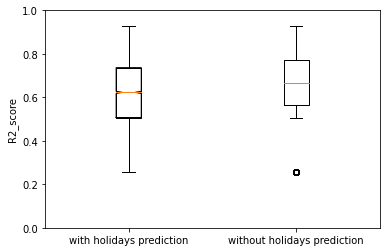

In [ ]:
R2_list_test
R2_list_test_positive = []
R2_list_test_negative = []

for r2 in R2_list_test :
  if r2 > 0:
     R2_list_test_positive.append(r2)

  else :
    R2_list_test_negative.append(r2)

print(R2_list_test_negative)

print(max(R2_list_test_positive))

plt.boxplot(R2_list_test, R2_list_test_positive)

import pylab

BoxName = ['with holidays prediction','without holidays prediction']

data = [R2_list_test,R2_list_test_positive]

plt.boxplot(data)

plt.ylim(0,1)


plt.ylabel('R2_score')
pylab.xticks([1,2], BoxName)


plt.show()



In [ ]:
print(x_test_data.index[2491])

2019-10-18 19:00:00


In [ ]:
print(test_data)

                     conso_lead_0  ...  clust_lag_d7_23
date_time                          ...                 
2019-07-07 00:00:00      0.003997  ...              1.0
2019-07-07 01:00:00      0.036858  ...              2.0
2019-07-07 02:00:00      0.012390  ...              2.0
2019-07-07 03:00:00      0.012523  ...              2.0
2019-07-07 04:00:00      0.011946  ...              2.0
...                           ...  ...              ...
2020-01-30 20:00:00      0.018207  ...              2.0
2020-01-30 21:00:00      0.007549  ...              2.0
2020-01-30 22:00:00      0.022204  ...              2.0
2020-01-30 23:00:00      0.022204  ...              2.0
2020-01-31 00:00:00      0.003553  ...              2.0

[4993 rows x 144 columns]
